<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovate-able:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

## STEP 1: Data cleaning

In [2]:
# Load the data
df = pd.read_csv('./housing.csv')

In [3]:
#remove non-residential sales
df = df[df['MSZoning'].isin(['A', 'C','I','C (all)'])==False]
#look into column data type and presence of missing cells
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
Id               1450 non-null int64
MSSubClass       1450 non-null int64
MSZoning         1450 non-null object
LotFrontage      1191 non-null float64
LotArea          1450 non-null int64
Street           1450 non-null object
Alley            89 non-null object
LotShape         1450 non-null object
LandContour      1450 non-null object
Utilities        1450 non-null object
LotConfig        1450 non-null object
LandSlope        1450 non-null object
Neighborhood     1450 non-null object
Condition1       1450 non-null object
Condition2       1450 non-null object
BldgType         1450 non-null object
HouseStyle       1450 non-null object
OverallQual      1450 non-null int64
OverallCond      1450 non-null int64
YearBuilt        1450 non-null int64
YearRemodAdd     1450 non-null int64
RoofStyle        1450 non-null object
RoofMatl         1450 non-null object
Exterior1st      1450 non-n

In [4]:
#null values in object variables represent houses without a certain feature. 
#these objects are 89 alley, 1442 MasVnrType, 1413 BsmtQual, 769 FireplaceQu, 1371 GarageType, 7 PoolQC, 278 Fence, 52 MiscFeature 
#Replace null values with not_present later.

#investigate null values for continuous variable LotFrontage, MasVnrArea
df[df['LotFrontage'].isnull()]#lot is present even though frontage area is not present. 
df['LotFrontage'].fillna(0, inplace=True)#replace missing LotFrontage with area 0.
df.loc[df['MasVnrArea'].isnull(), 'Id':'MasVnrArea']#MasVnrType should be unknown for these 8 houses. Drop them
df.dropna(subset=['MasVnrArea'], inplace=True)
df = df.drop('Id',axis=1) # drop Id column

In [5]:
#create cols of built/rennovation time difference to sale, so as to study plausible relationships of building and remodelling to saleprice
df['YearBuilt_tosale'] = df['YrSold']-df['YearBuilt']
df['YearRemodAdd_tosale'] = df['YrSold']-df['YearRemodAdd']
df['GarageYrBlt_tosale'] = df['YrSold']-df['GarageYrBlt']
#drop these built/rennovation year columns to prevent unnecessary dummies since information has been incorporate
df.drop(['YearBuilt','YearRemodAdd','GarageYrBlt'], axis=1, inplace=True)

In [6]:
#convert to objects: MSSubClass, MoSold, YrSold
df['MSSubClass'] = df['MSSubClass'].astype('O')
df['MoSold'] = df['MoSold'].astype('O')
df['YrSold'] = df['YrSold'].astype('O')

In [7]:
df['YrSold'].dtype

dtype('O')

In [8]:
#get continuous and object columns
objdf = df.select_dtypes('O')
numdf = df.select_dtypes(include=np.number)

## STEP 1.1: Clean numeric columns

In [9]:
numdf.iloc[:,:17].agg(['min','median','mean','max','std']) #check for negative values or extreme values

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath
min,0.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.00000,334.000000,0.000000,0.000000,0.000000,0.000000
median,63.000000,9496.000000,6.000000,5.000000,0.000000,383.500000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.00000,1466.000000,0.000000,0.000000,2.000000,0.000000
mean,57.551318,10514.252427,6.108183,5.585992,104.404300,443.490291,47.130374,567.205964,1057.826630,1163.419556,347.348128,5.56172,1516.329404,0.425798,0.057559,1.566574,0.383495
max,313.000000,215245.000000,10.000000,9.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.00000,5642.000000,3.000000,2.000000,3.000000,2.000000
std,34.702070,10020.693765,1.371142,1.107616,181.486539,455.618393,162.239256,442.806130,438.627671,385.074042,436.938845,47.06125,525.306768,0.519275,0.238871,0.548867,0.503235


In [10]:
numdf.iloc[:,17:].agg(['min','median','mean','max','std']) #check for negative values or extreme values, -1 in YearRemodAdd_tosale

,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,YearBuilt_tosale,YearRemodAdd_tosale,GarageYrBlt_tosale
min,0.000000,0.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37900.000000,0.000000,-1.000000,0.000000
median,3.000000,1.00000,6.000000,1.000000,2.000000,478.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,163000.000000,35.000000,14.000000,28.000000
mean,2.871012,1.04577,6.521498,0.615811,1.768377,472.771151,95.003467,46.265603,21.517337,3.452150,15.180305,2.793343,43.606103,181350.757282,36.369626,22.852288,29.314747
max,8.000000,3.00000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,755000.000000,136.000000,60.000000,102.000000
std,0.813662,0.21879,1.626002,0.643744,0.746325,212.987361,125.616473,65.004272,60.807532,29.497376,56.036985,40.426271,499.005429,79019.276227,30.056574,20.549454,24.629411


C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\pandas\core\indexing.py:537: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


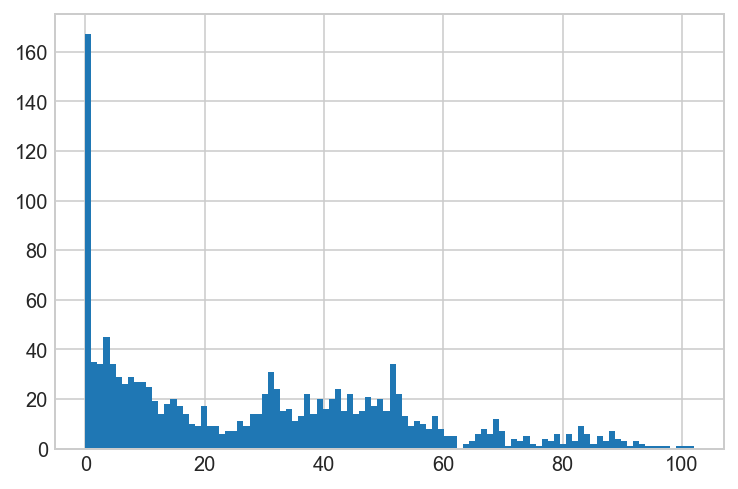

In [11]:
#replace negative with 0 in dataframe
numdf.loc[numdf['YearRemodAdd_tosale']==-1,'YearRemodAdd_tosale']=0
#check GarageYrBlt_tosale distribution before replacing 71 null values which are houses without garages
numdf['GarageYrBlt_tosale'].hist(bins=100)
numdf.loc[numdf['GarageYrBlt_tosale'].isnull(),'GarageYrBlt_tosale']= np.median(numdf['GarageYrBlt_tosale'].notnull())

In [12]:
#presence of zero values due to feature not present or that ordered feature has rank of 0
for c in numdf.columns:
    print c, (numdf[c] == 0).sum()
#feature not present has been represented in object columns with NAs: BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, GarageCars, GarageArea, PoolArea, MiscVal
#feature to create not_present dummy: LotFrontage, MasVnrArea, 2ndFlrSF, LowQualFinSF, WoodDeckSF, OpenPorchSF
#feature to drop due to too many missing values: EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscVal

LotFrontage 257
LotArea 0
OverallQual 0
OverallCond 0
MasVnrArea 851
BsmtFinSF1 459
BsmtFinSF2 1275
BsmtUnfSF 117
TotalBsmtSF 37
1stFlrSF 0
2ndFlrSF 819
LowQualFinSF 1417
GrLivArea 0
BsmtFullBath 845
BsmtHalfBath 1361
FullBath 8
HalfBath 901
BedroomAbvGr 6
KitchenAbvGr 1
TotRmsAbvGrd 0
Fireplaces 677
GarageCars 79
GarageArea 79
WoodDeckSF 747
OpenPorchSF 648
EnclosedPorch 1241
3SsnPorch 1418
ScreenPorch 1327
PoolArea 1435
MiscVal 1392
SalePrice 0
YearBuilt_tosale 63
YearRemodAdd_tosale 122
GarageYrBlt_tosale 82


In [13]:
#drop limited info columns
numdf.drop(['EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'], axis=1, inplace=True)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [14]:
#create dummies for features present for selected columns
#refer to week 5 lab logistic regression to understand the creation of dummy column and replacing zeros with median values 
for c in ['LotFrontage', 'MasVnrArea', '2ndFlrSF', 'LowQualFinSF', 'WoodDeckSF', 'OpenPorchSF']:
    numdf[c+'_pres'] = (numdf[c] > 0).astype(int)
    numdf[c+'_pres'] = numdf[c+'_pres'].astype('object')

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [15]:
#concat category columns with object dataframe
cat_col = [c for c in numdf.columns if '_pres' in c]
objdf = pd.concat([objdf, numdf[cat_col]], axis=1)
#drop category columns from numdf
numdf.drop(cat_col, axis=1, inplace=True)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [16]:
cat_col

['LotFrontage_pres',
 'MasVnrArea_pres',
 '2ndFlrSF_pres',
 'LowQualFinSF_pres',
 'WoodDeckSF_pres',
 'OpenPorchSF_pres']

In [17]:
#replace zero with median values to neutralize selected columns for better coefficient analysis later
for c in ['LotFrontage', 'MasVnrArea', '2ndFlrSF', 'LowQualFinSF', 'WoodDeckSF', 'OpenPorchSF','BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageCars', 'GarageArea']:
    numdf[c] = numdf[c].apply(lambda x: np.median(numdf[c]) if x<=0 else x)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [18]:
#due to high number of zeros affecting median value, remove columns MasVnrArea, BsmtFinSF2, LowQualFinSF, WoodDeckSF, 2ndFlrSF
for c in numdf.columns:
    print c, (numdf[c] == 0).sum()
numdf.drop(['MasVnrArea', 'BsmtFinSF2', 'LowQualFinSF', 'WoodDeckSF', '2ndFlrSF'], axis=1, inplace=True)
numdf.head()

LotFrontage 0
LotArea 0
OverallQual 0
OverallCond 0
MasVnrArea 851
BsmtFinSF1 0
BsmtFinSF2 1275
BsmtUnfSF 0
TotalBsmtSF 0
1stFlrSF 0
2ndFlrSF 819
LowQualFinSF 1417
GrLivArea 0
BsmtFullBath 845
BsmtHalfBath 1361
FullBath 8
HalfBath 901
BedroomAbvGr 6
KitchenAbvGr 1
TotRmsAbvGrd 0
Fireplaces 677
GarageCars 0
GarageArea 0
WoodDeckSF 747
OpenPorchSF 0
SalePrice 0
YearBuilt_tosale 63
YearRemodAdd_tosale 122
GarageYrBlt_tosale 82


C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,LotFrontage,LotArea,OverallQual,OverallCond,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,BsmtFullBath,...,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,OpenPorchSF,SalePrice,YearBuilt_tosale,YearRemodAdd_tosale,GarageYrBlt_tosale
0,65.0,8450,7,5,706.0,150.0,856.0,856,1710,1,...,1,8,0,2.0,548.0,61.0,208500,5,5,5.0
1,80.0,9600,6,8,978.0,284.0,1262.0,1262,1262,0,...,1,6,1,2.0,460.0,25.0,181500,31,31,31.0
2,68.0,11250,7,5,486.0,434.0,920.0,920,1786,1,...,1,6,1,2.0,608.0,42.0,223500,7,6,7.0
3,60.0,9550,7,5,216.0,540.0,756.0,961,1717,1,...,1,7,1,3.0,642.0,35.0,140000,91,36,8.0
4,84.0,14260,8,5,655.0,490.0,1145.0,1145,2198,1,...,1,9,1,3.0,836.0,84.0,250000,8,8,8.0


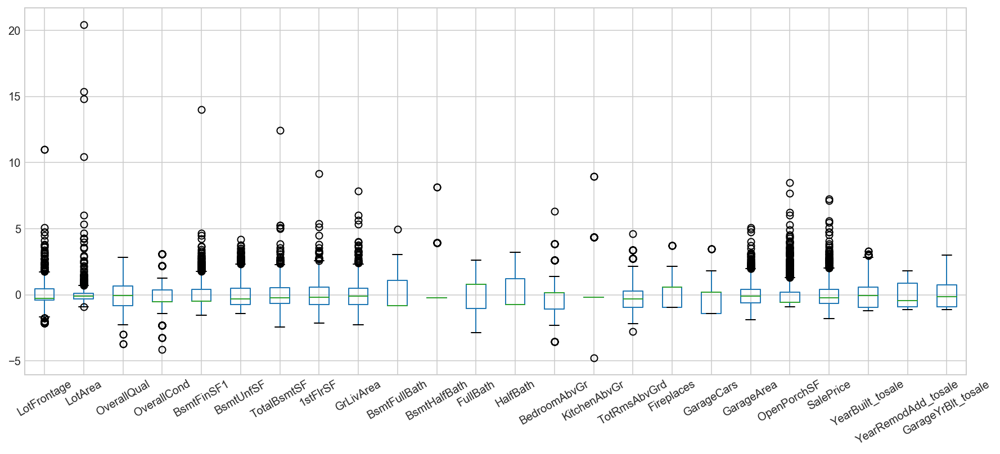

In [19]:
#standardizing continuous variables so as to have a better view of boxplot and distributions
from sklearn.preprocessing import StandardScaler
numdf_ss = StandardScaler().fit_transform(numdf)
numdf_ss = pd.DataFrame(numdf_ss, columns = numdf.columns.values) 

ax = numdf_ss.boxplot(figsize=(15,6))
ax.set_xticklabels(ax.get_xticklabels(),rotation=30);
#looks like there are presence of lognormal distributions especially columns with areas and values

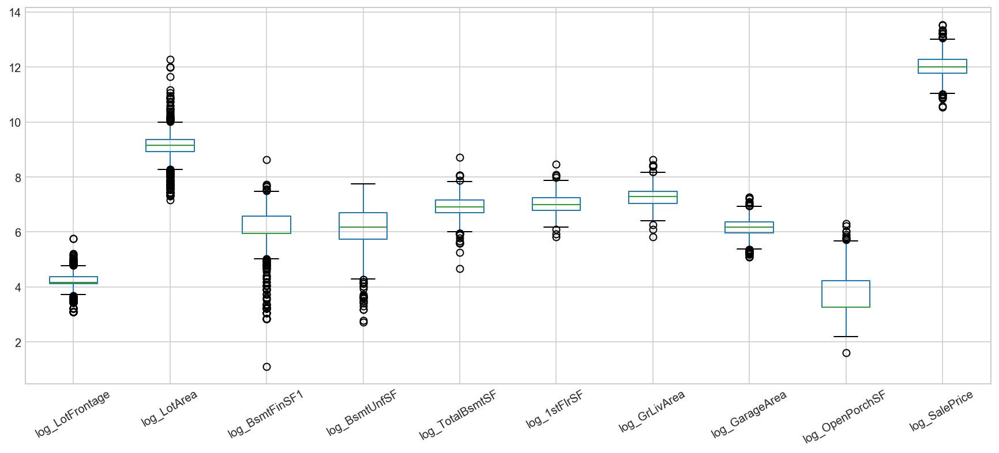

In [20]:
#remove ordered variables, log selected (area and value) columns of pre-standardized continuous variables, +1 to remove error from np.log(0)
#since SalePrice will be logged as well, the model will be log-log/linear
log_numdf = np.log(numdf.drop(['OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath',
                                 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars',
                                 'YearBuilt_tosale','YearRemodAdd_tosale','GarageYrBlt_tosale'], axis=1) +1)
log_numdf.columns = ['log_' + str(col) for col in log_numdf.columns]

ax = log_numdf.boxplot(figsize=(15,6))
ax.set_xticklabels(ax.get_xticklabels(),rotation=30);

In [21]:
num_others = numdf[['OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr',
                  'TotRmsAbvGrd','Fireplaces','GarageCars','YearBuilt_tosale','YearRemodAdd_tosale','GarageYrBlt_tosale']]
numdf_clean = pd.concat([num_others,log_numdf], axis=1)

## STEP 1.2: Clean object columns

In [22]:
#for category occurrence in object columns
for c in objdf.columns:
    print objdf[c].value_counts()
#subsume datapoints <5% of dataframe len into an aggregate of others to prevent explosion of meaningless dummies.

20     530
60     296
50     140
120     86
30      67
160     63
70      59
80      58
90      52
190     29
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
RL    1146
RM     218
FV      62
RH      16
Name: MSZoning, dtype: int64
Pave    1438
Grvl       4
Name: Street, dtype: int64
Grvl    50
Pave    38
Name: Alley, dtype: int64
Reg    910
IR1    481
IR2     41
IR3     10
Name: LotShape, dtype: int64
Lvl    1297
Bnk      62
HLS      49
Low      34
Name: LandContour, dtype: int64
AllPub    1441
NoSeWa       1
Name: Utilities, dtype: int64
Inside     1038
Corner      260
CulDSac      93
FR2          47
FR3           4
Name: LotConfig, dtype: int64
Gtl    1367
Mod      62
Sev      13
Name: LandSlope, dtype: int64
NAmes      225
CollgCr    149
OldTown    112
Edwards    100
Somerst     83
Gilbert     78
NridgHt     76
Sawyer      74
NWAmes      73
BrkSide     58
SawyerW     58
Crawfor     50
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      28
C

In [23]:
#replace categories in original dataframe with less than 5% of dataframe len with Others for credible sample size and limit no. of dummies
for col in objdf.drop(['MoSold','YrSold', 'LotFrontage_pres', 'MasVnrArea_pres', '2ndFlrSF_pres', 'LowQualFinSF_pres',
 'WoodDeckSF_pres', 'OpenPorchSF_pres'], axis=1).columns:
    otherls = []
    for i, e in objdf[col].value_counts().items():
        if e < 0.05*len(df):
            otherls.append(i)
    objdf.loc[objdf[col].isin(otherls), col] = 'Others'

In [24]:
objdf.fillna('not_pres', inplace=True)
#MoSold and YrSold get convert to integer after fillna command
objdf['MoSold'] = objdf['MoSold'].astype('object')
objdf['YrSold'] = objdf['YrSold'].astype('object')

### Merge cleaned numeric and object columns

In [25]:
df_clean = pd.concat([objdf,numdf_clean], axis=1)

In [26]:
df_clean.info() #swee dataset

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1442 entries, 0 to 1459
Data columns (total 76 columns):
MSSubClass             1442 non-null object
MSZoning               1442 non-null object
Street                 1442 non-null object
Alley                  1442 non-null object
LotShape               1442 non-null object
LandContour            1442 non-null object
Utilities              1442 non-null object
LotConfig              1442 non-null object
LandSlope              1442 non-null object
Neighborhood           1442 non-null object
Condition1             1442 non-null object
Condition2             1442 non-null object
BldgType               1442 non-null object
HouseStyle             1442 non-null object
RoofStyle              1442 non-null object
RoofMatl               1442 non-null object
Exterior1st            1442 non-null object
Exterior2nd            1442 non-null object
MasVnrType             1442 non-null object
ExterQual              1442 non-null object
ExterCond    

## Step 2: Exploratory analysis and Feature Selection

In [27]:
#selecting fixed features.
FF = ['MSSubClass',
'MSZoning',
'Street',
'Alley',
'LotShape',
'LandContour',
'Utilities',
'LotConfig',
'LandSlope',
'Neighborhood',
'Condition1',
'Condition2',
'BldgType',
'HouseStyle',
'GarageFinish',
'PavedDrive',
'Fence',
'MiscFeature',
'MoSold',
'YrSold',#to remove YrSold maybe
'SaleType',
'SaleCondition',
'BsmtFullBath',
'BsmtHalfBath',
'FullBath',
'HalfBath',
'BedroomAbvGr',
'KitchenAbvGr',
'TotRmsAbvGrd',
'Fireplaces',
'GarageCars',
'YearBuilt_tosale',
'YearRemodAdd_tosale',
'GarageYrBlt_tosale',
'log_LotFrontage',
'log_LotArea',
'log_TotalBsmtSF',
'log_1stFlrSF',
'log_GrLivArea',
'log_GarageArea',
'log_OpenPorchSF',
'log_SalePrice',
'LotFrontage_pres',
'MasVnrArea_pres',
'2ndFlrSF_pres',
'LowQualFinSF_pres',
'WoodDeckSF_pres',
'OpenPorchSF_pres',
'BsmtExposure']

df_ff = df_clean[FF]

In [28]:
#convert 'LotFrontage_pres','OpenPorchSF_pres','BsmtExposure' to object columns
df_ff[['LotFrontage_pres','MasVnrArea_pres','2ndFlrSF_pres','LowQualFinSF_pres','WoodDeckSF_pres','OpenPorchSF_pres','BsmtExposure']] = df_ff[['LotFrontage_pres','MasVnrArea_pres','2ndFlrSF_pres','LowQualFinSF_pres','WoodDeckSF_pres','OpenPorchSF_pres','BsmtExposure']].astype('object')

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [29]:
#Explore object and numeric columns separately
objdf_ff = df_ff.select_dtypes('O')
numdf_ff = df_ff.select_dtypes(include=np.number)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


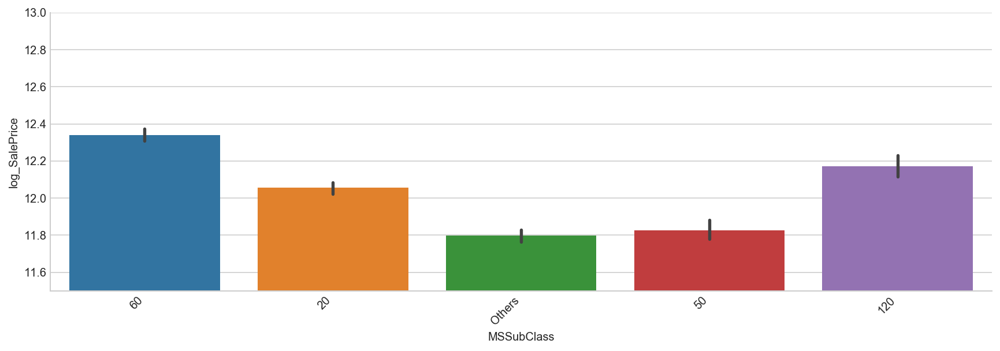

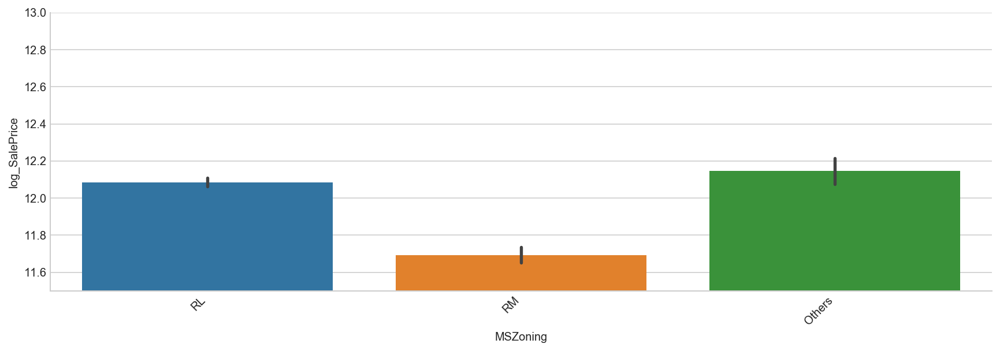

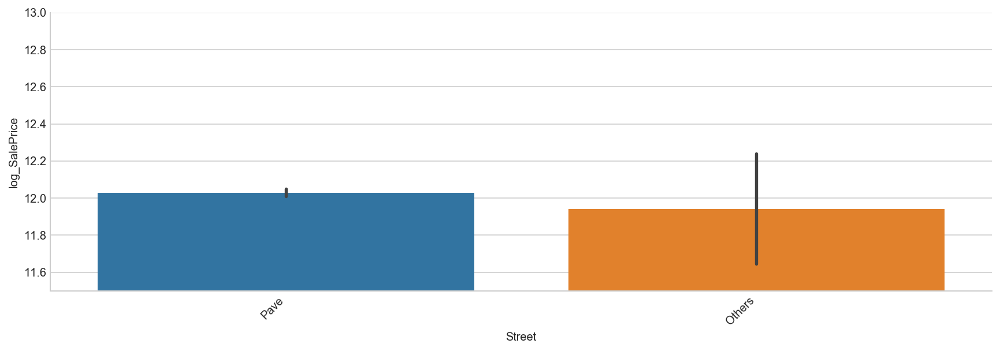

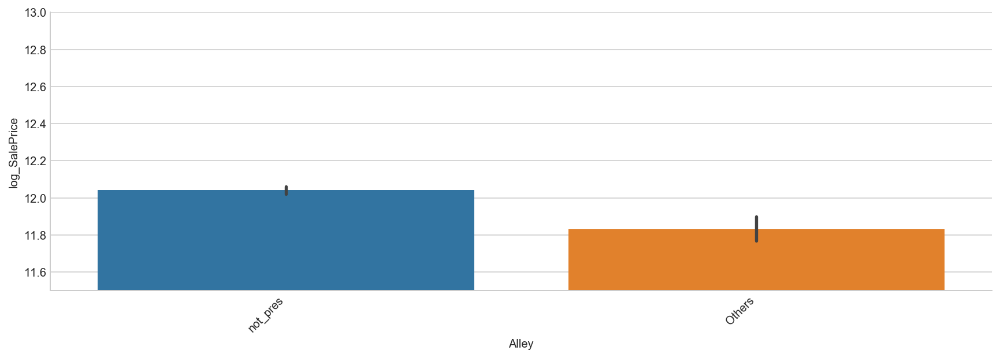

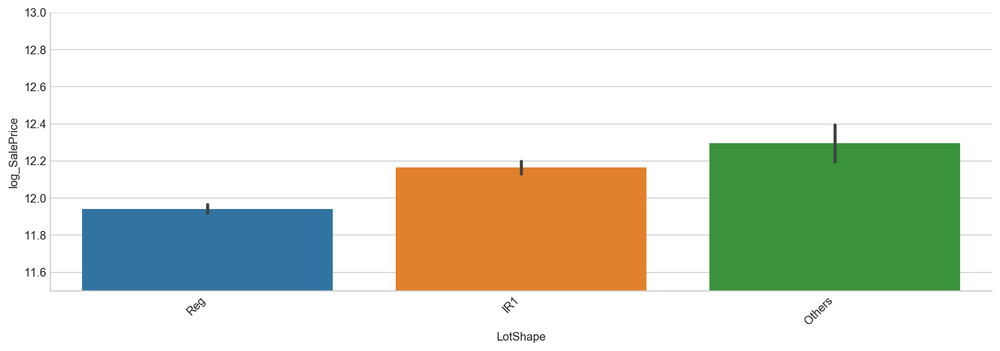

...

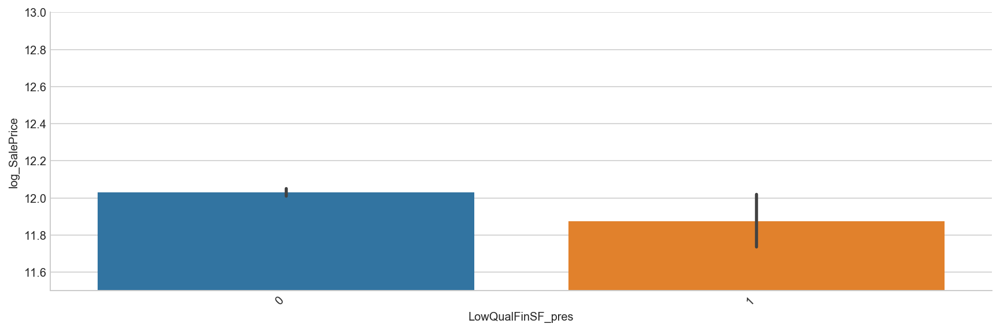

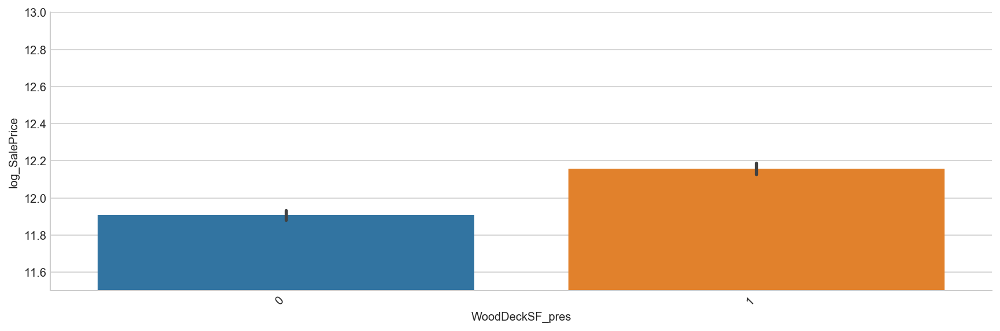

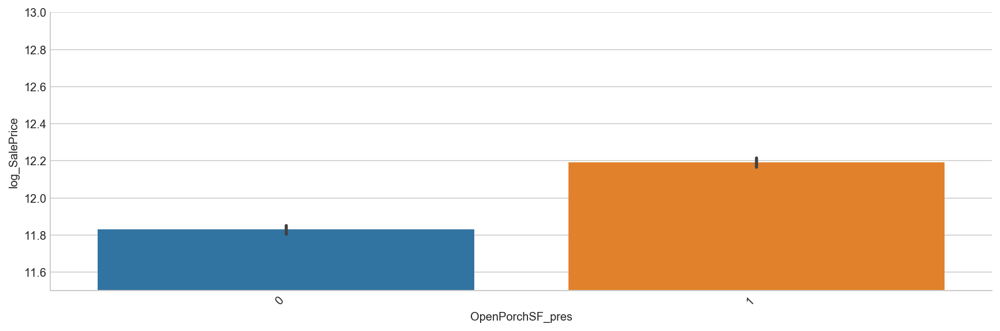

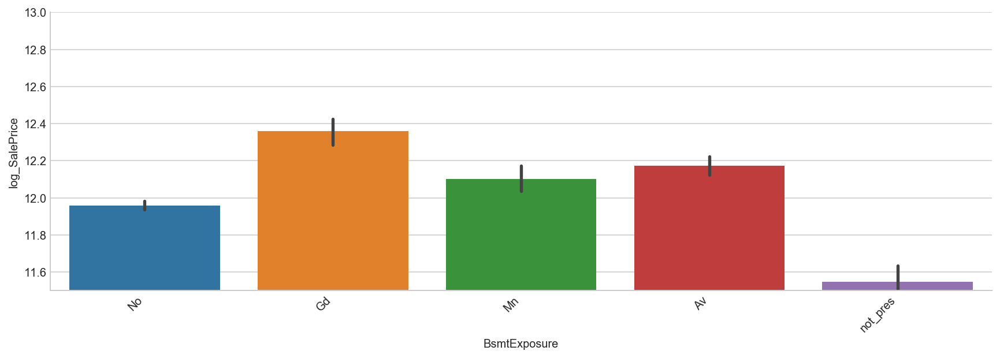

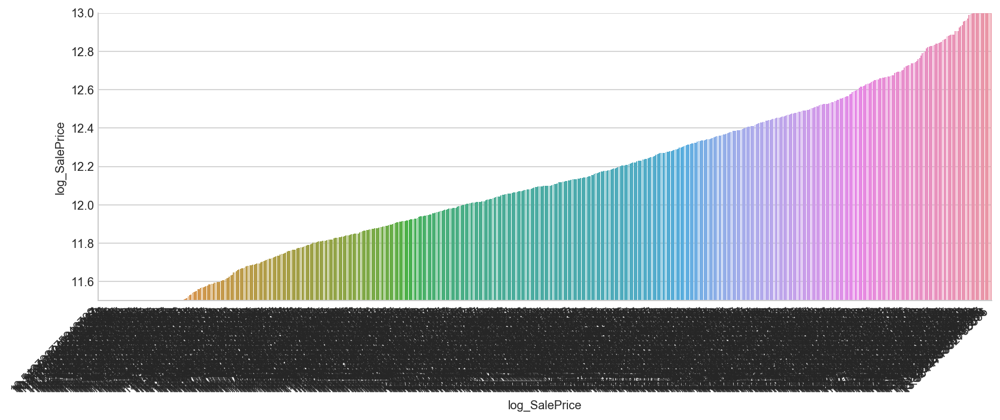

In [30]:
#Use factor plot to check whether sale prices differs across categories of object variables.
#most have some mean difference except street, land contour, landslope, condition2, MoSold and YrSold
objdf_ff['log_SalePrice'] = numdf_ff['log_SalePrice']
for c in objdf_ff.columns:
    sns.factorplot(x=c, y='log_SalePrice', data=objdf_ff, kind='bar', aspect=3).set_xticklabels(rotation=45, horizontalalignment='right')
    plt.ylim(11.5, 13)

In [31]:
#split numdf_ff into ordered and logged variables
numdf_ff.columns
ord_ff = numdf_ff[['BsmtFullBath','BsmtHalfBath', 'FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr',
         'TotRmsAbvGrd','Fireplaces','GarageCars','YearBuilt_tosale','YearRemodAdd_tosale','GarageYrBlt_tosale']]
log_ff = numdf_ff.drop(ord_ff.columns, axis=1)
ord_ff = pd.concat([ord_ff,log_ff['log_SalePrice']], axis=1) #add back target variable

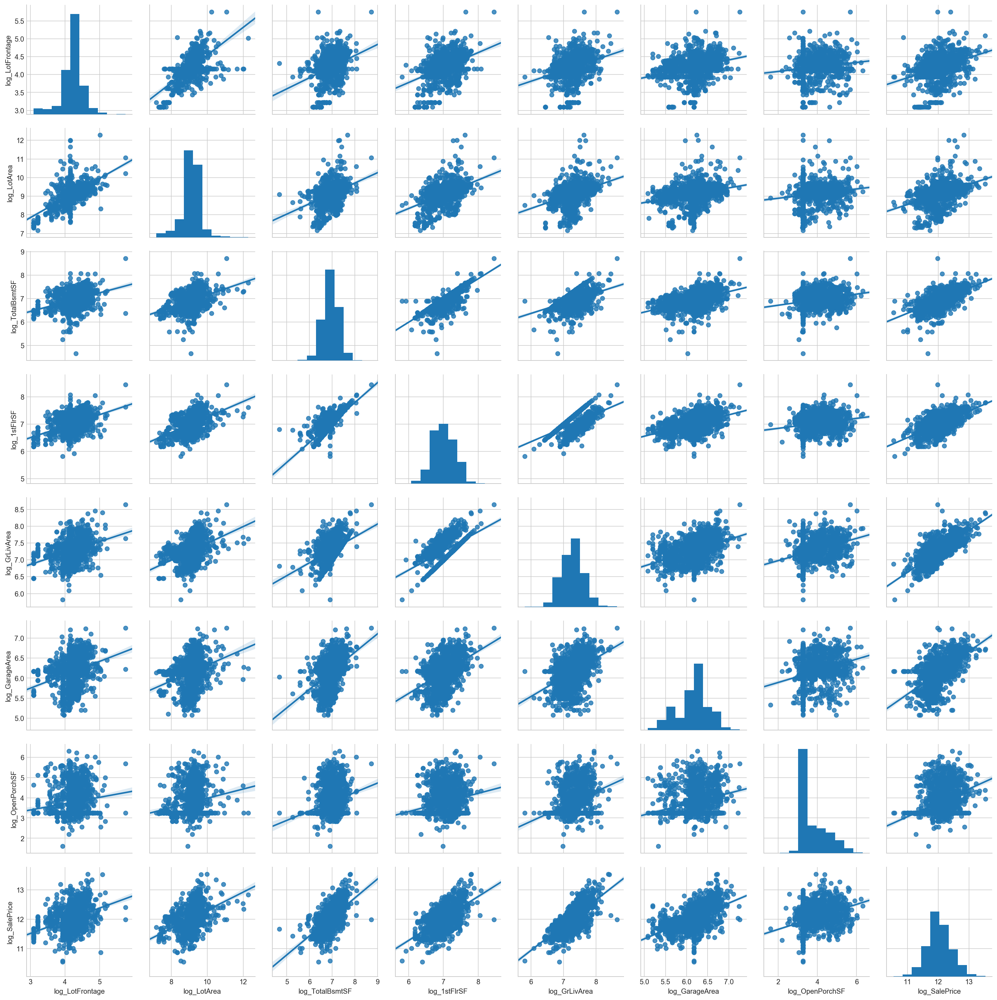

In [32]:
#check for scatterplot relationships for logged variables with salesprice
sns.pairplot(log_ff, kind="reg")
#observe the last row. Linear relationship is present for the log-log variables

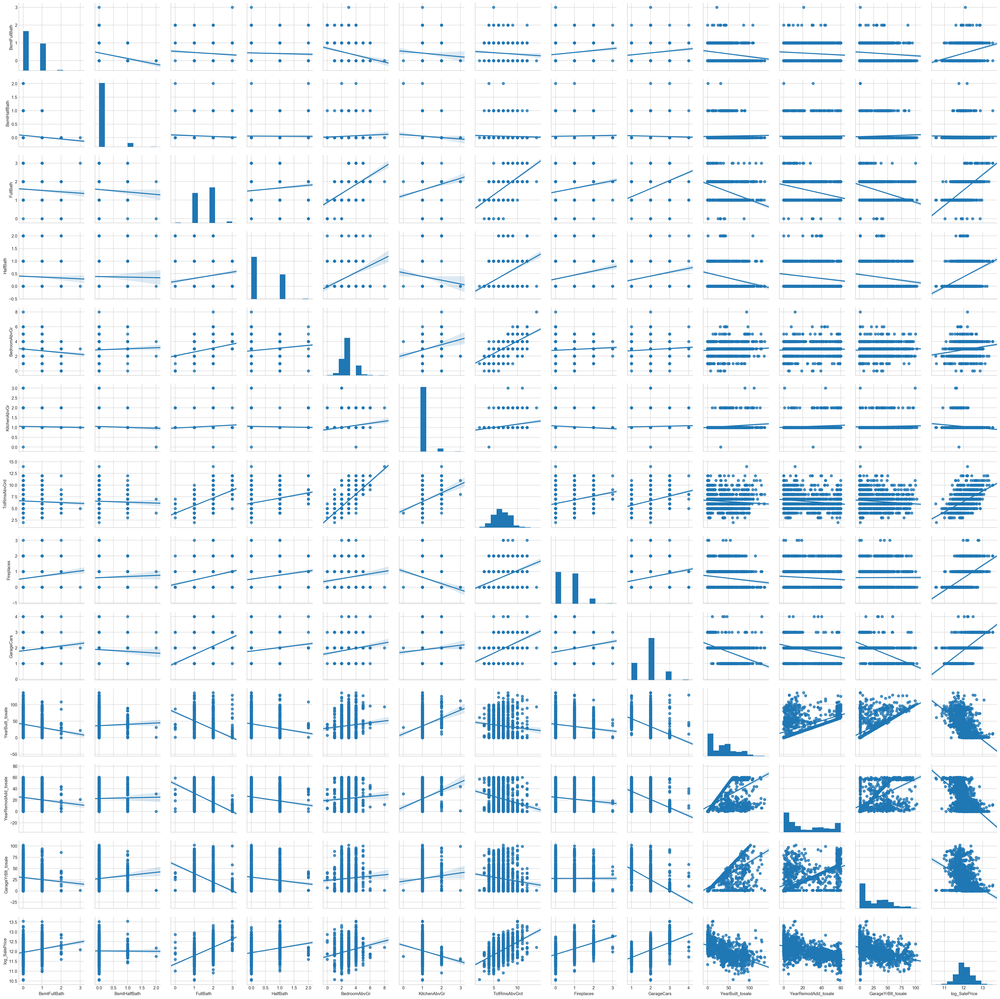

In [33]:
#check for scatterplot relationships for ordered variables with salesprice
sns.pairplot(ord_ff, kind="reg")
#other than bsmt bath and half bath, inear relationship is present for the other ordered variables

In [34]:
#top 10 strongest numeric variable correlation with SalePrice
corr = numdf_ff.corr().unstack().reset_index()
corr['abs'] = corr[0].abs()
corr[(corr[0] != 1.0) & (corr['level_0'] == 'log_SalePrice')].sort_values('abs', ascending=False).head(10)

,level_0,level_1,0,abs
396,log_SalePrice,log_GrLivArea,0.732820,0.732820
395,log_SalePrice,log_1stFlrSF,0.606852,0.606852
388,log_SalePrice,GarageCars,0.597236,0.597236
382,log_SalePrice,FullBath,0.592184,0.592184
394,log_SalePrice,log_TotalBsmtSF,0.588435,0.588435
389,log_SalePrice,YearBuilt_tosale,-0.582727,0.582727
397,log_SalePrice,log_GarageArea,0.571440,0.571440
390,log_SalePrice,YearRemodAdd_tosale,-0.560704,0.560704
386,log_SalePrice,TotRmsAbvGrd,0.537994,0.537994
387,log_SalePrice,Fireplaces,0.489199,0.489199


## Feature Selection

In [35]:
#get dummies into new dataframe
dummies = pd.get_dummies(objdf_ff.drop(['YrSold', 'log_SalePrice'], axis=1), drop_first = True)
dummies.head()
df_ff_dum = dummies.merge(numdf_ff, left_index = True, right_index = True,how = 'outer')#merge back
df_ff_dum['YrSold'] = objdf_ff['YrSold']
print df_ff_dum.shape
df_ff_dum.head()

(1442, 88)


,MSSubClass_50,MSSubClass_60,MSSubClass_120,MSSubClass_Others,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_not_pres,LotShape_Others,LotShape_Reg,...,GarageYrBlt_tosale,log_LotFrontage,log_LotArea,log_TotalBsmtSF,log_1stFlrSF,log_GrLivArea,log_GarageArea,log_OpenPorchSF,log_SalePrice,YrSold
0,0,1,0,0,1,0,1,1,0,1,...,5.0,4.189655,9.042040,6.753438,6.753438,7.444833,6.308098,4.127134,12.247699,2008
1,0,0,0,0,1,0,1,1,0,1,...,31.0,4.394449,9.169623,7.141245,7.141245,7.141245,6.133398,3.258097,12.109016,2007
2,0,1,0,0,1,0,1,1,0,0,...,7.0,4.234107,9.328212,6.825460,6.825460,7.488294,6.411818,3.761200,12.317171,2008
3,0,0,0,1,1,0,1,1,0,0,...,8.0,4.110874,9.164401,6.629363,6.869014,7.448916,6.466145,3.583519,11.849405,2006
4,0,1,0,0,1,0,1,1,0,0,...,8.0,4.442651,9.565284,7.044033,7.044033,7.695758,6.729824,4.442651,12.429220,2008


In [36]:
#get train test datasets
X_train = df_ff_dum[df_ff_dum['YrSold'] != 2010]
X_train.drop(['log_SalePrice','YrSold'], axis=1, inplace=True)
X_test = df_ff_dum[df_ff_dum['YrSold'] == 2010]
X_test.drop(['log_SalePrice','YrSold'], axis=1, inplace=True)

y_train = df_ff_dum[df_ff_dum['YrSold'] != 2010]['log_SalePrice']
y_test = df_ff_dum[df_ff_dum['YrSold'] == 2010]['log_SalePrice']

#standardising
X_train_ss = StandardScaler().fit_transform(X_train)
X_test_ss = StandardScaler().fit_transform(X_test)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [37]:
X_train.columns

Index([u'MSSubClass_50', u'MSSubClass_60', u'MSSubClass_120',
       u'MSSubClass_Others', u'MSZoning_RL', u'MSZoning_RM', u'Street_Pave',
       u'Alley_not_pres', u'LotShape_Others', u'LotShape_Reg',
       u'LandContour_Others', u'Utilities_Others', u'LotConfig_CulDSac',
       u'LotConfig_Inside', u'LotConfig_Others', u'LandSlope_Others',
       u'Neighborhood_Edwards', u'Neighborhood_Gilbert', u'Neighborhood_NAmes',
       u'Neighborhood_NWAmes', u'Neighborhood_NridgHt',
       u'Neighborhood_OldTown', u'Neighborhood_Others', u'Neighborhood_Sawyer',
       u'Neighborhood_Somerst', u'Condition1_Norm', u'Condition1_Others',
       u'Condition2_Others', u'BldgType_Others', u'BldgType_TwnhsE',
       u'HouseStyle_1Story', u'HouseStyle_2Story', u'HouseStyle_Others',
       u'GarageFinish_RFn', u'GarageFinish_Unf', u'GarageFinish_not_pres',
       u'PavedDrive_Others', u'PavedDrive_Y', u'Fence_Others',
       u'Fence_not_pres', u'MiscFeature_not_pres', u'MoSold_2', u'MoSold_3',
       u

### Top variables from f-test, recursive feature and lasso

In [38]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import RFECV
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score

#f-test
selector=SelectKBest(score_func=f_classif,k=10) #select k predictors from f-test
selector.fit(X_train_ss,y_train)
list(zip(X_train.columns.values, selector.scores_, selector.pvalues_)) #print variable, F-test value & p-value
X_f_col = np.array(X_train.columns[selector.get_support(True)]) #select chosen column, true gives column index
print 'X_f_col,', X_f_col 

#Recursive feature elimination
estimator = LinearRegression()
selector = RFECV(estimator, step=1, cv=10)
selector = selector.fit(X_train_ss, y_train)
list(zip(X_train.columns.values, selector.support_, selector.ranking_)) #print variables, selection and ranks -> rank 1 is the best
X_RFECV_col = np.array(X_train.columns[selector.support_]) #select chosen column from TRUE
print 'X_RFECV_col:',X_RFECV_col

#lasso
optimal_lasso = LassoCV(n_alphas=500, cv=10) #LassoCV decide what alphas to use, just set no. of alphas to test.
optimal_lasso.fit(X_train_ss, y_train)
coefs = list(zip(X_train.columns.values, optimal_lasso.coef_))
coefs = pd.DataFrame.from_records(coefs)
coefs['abs'] = abs(coefs[1])
X_lasso_col = coefs[coefs['abs'] != 0].sort_values('abs', ascending=False).head(10)
X_lasso_col = np.array(X_lasso_col.iloc[:,0])
print 'X_lasso_col:', X_lasso_col

#common features selected for explanation
sel = list(X_RFECV_col)
for e in list(X_f_col):
    sel.append(e)
for e in list(X_lasso_col):
    sel.append(e)
from collections import Counter
sel_fea = pd.DataFrame.from_dict(Counter(sel), orient='index').reset_index()
print sel_fea.sort_values(0,ascending=False)

#stronger features as follows: 
#log_GrLivArea, Neighborhood, GarageCars (GarageFinish), YearBuilt_tosale, SaleType, Fireplaces, log_1stFlrSF, 
#BsmtFullBath (BsmtExposure), YearRemodAdd_tosale, log_TotalBsmtSF, FullBath, log_LotArea 

#strong correlated numeric columns in previous step
#log_GrLivArea, GarageCars, FullBath, log_TotalBsmtSF, YearBuilt_tosale, log_GarageArea, YearRemodAdd_tosale, TotRmsAbvGrd, Fireplaces

X_f_col, ['Street_Pave' 'Neighborhood_NridgHt' 'SaleType_WD'
 'SaleCondition_Partial' 'BsmtExposure_not_pres' 'FullBath' 'GarageCars'
 'YearBuilt_tosale' 'log_1stFlrSF' 'log_GrLivArea']
X_RFECV_col: ['MSSubClass_50' 'MSSubClass_60' 'MSSubClass_120' 'MSSubClass_Others'
 'MSZoning_RM' 'LotConfig_CulDSac' 'Neighborhood_Edwards'
 'Neighborhood_Gilbert' 'Neighborhood_NridgHt' 'Neighborhood_Others'
 'Neighborhood_Somerst' 'Condition1_Norm' 'BldgType_Others'
 'BldgType_TwnhsE' 'HouseStyle_1Story' 'HouseStyle_2Story'
 'GarageFinish_RFn' 'GarageFinish_Unf' 'GarageFinish_not_pres'
 'PavedDrive_Y' 'SaleType_Others' 'SaleType_WD' 'SaleCondition_Normal'
 '2ndFlrSF_pres_1' 'LowQualFinSF_pres_1' 'BsmtExposure_Gd'
 'BsmtExposure_No' 'BsmtExposure_not_pres' 'BsmtFullBath' 'FullBath'
 'HalfBath' 'BedroomAbvGr' 'KitchenAbvGr' 'TotRmsAbvGrd' 'Fireplaces'
 'GarageCars' 'YearBuilt_tosale' 'YearRemodAdd_tosale' 'log_LotArea'
 'log_TotalBsmtSF' 'log_1stFlrSF' 'log_GrLivArea' 'log_GarageArea']
X_lasso_col: ['l

In [39]:
#get selected columns
neighborhood_cols = [c for c in X_train.columns if 'Neighborhood' in c]
SaleType_cols = [c for c in X_train.columns if 'SaleType' in c]
GarageFinish_cols = [c for c in X_train.columns if 'GarageFinish' in c]
BsmtExposure_cols = [c for c in X_train.columns if 'BsmtExposure' in c]
sel_cols = ['log_GrLivArea', 'GarageCars', 'YearBuilt_tosale', 'Fireplaces', 'log_1stFlrSF', 'BsmtFullBath', 'YearRemodAdd_tosale', 'log_TotalBsmtSF', 'FullBath', 'log_LotArea']
sel_cols = sel_cols + neighborhood_cols + SaleType_cols + GarageFinish_cols + BsmtExposure_cols
print 'selected columns:',len(sel_cols)
X_train_sel = X_train[sel_cols]

selected columns: 28


In [40]:
#check for multicollinearity issue
corr = X_train_sel.corr().unstack().reset_index()
corr['abs'] = corr[0].abs()
corr[(corr[0] != 1.0)].sort_values('abs', ascending=False).head(10)

,level_0,level_1,0,abs
200,log_TotalBsmtSF,log_1stFlrSF,0.826687,0.826687
119,log_1stFlrSF,log_TotalBsmtSF,0.826687,0.826687
224,FullBath,log_GrLivArea,0.646890,0.646890
8,log_GrLivArea,FullBath,0.646890,0.646890
62,YearBuilt_tosale,YearRemodAdd_tosale,0.591360,0.591360
170,YearRemodAdd_tosale,YearBuilt_tosale,0.591360,0.591360
552,SaleType_Others,SaleType_WD,-0.565653,0.565653
579,SaleType_WD,SaleType_Others,-0.565653,0.565653
4,log_GrLivArea,log_1stFlrSF,0.542833,0.542833
112,log_1stFlrSF,log_GrLivArea,0.542833,0.542833


In [41]:
#remove log_TotalBsmtSF, FullBath, YearBuilt_tosale due to high collinearity
X_train_sel.drop(['log_TotalBsmtSF','FullBath', 'YearBuilt_tosale'], axis=1, inplace=True)
X_test_sel = X_test[X_train_sel.columns]#select columns for test set as well

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


### Explanatory model: selected variables' effects on sale price

In [42]:
#check for coefficient significance and interpret variable effects
# http://www.cazaar.com/ta/econ113/interpreting-beta
import statsmodels.formula.api as sm
X = np.concatenate([X_train_sel, np.ones((X_train_sel.shape[0], 1))], axis=1)
y = y_train
model = sm.OLS(y, X)
model = model.fit()
model.summary(xname = X_train_sel.columns.values.tolist() + ['const'])
#The model explains 84.3% of the variation in saleprice, coefficients are statistically significant.
#Interpretation as follows:
#For log variables: 1% increase in predictor increases saleprice by coef%. For eg. 1% increase in ground living area increases 0.44% of sale price.
#For non-log variables: 1 unit increase in predictor increases saleprice by (100*coef)%. For eg. increase in garage car space by 1 car increases 7.8% of sale price.
#For dummy variables: the presence of predictor increases saleprice by (100*coef)%, relative to baseline (dropped dummy). For eg. being in Edwards neighborhood gives a 14% lower sale price than (baseline) CollgCr neighborhood.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.843
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     267.3
Date:                Thu, 05 Jul 2018   Prob (F-statistic):               0.00
Time:                        18:12:02   Log-Likelihood:                 566.14
No. Observations:                1271   AIC:                            -1080.
Df Residuals:                    1245   BIC:                            -946.4
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
log_GrLivArea             0.4372      0.019     22.792      0.000       0.400       0.475
GarageCars                0.0755      0.010      7.847      0.000       0.057       0.094
Fireplaces                0.0559      0.008      6.594      0.000       0.039       0.072
log_1stFlrSF              0.1026      0.020      5.059      0.000       0.063       0.142
BsmtFullBath              0.0558      0.009      5.890      0.000       0.037       0.074
YearRemodAdd_tosale      -0.0034      0.000    -12.008      0.000      -0.004      -0.003
log_LotArea               0.0754      0.010      7.239      0.000       0.055       0.096
Neighborhood_Edwards     -0.1444      0.023     -6.147      0.000      -0.190      -0.098
Neighborhood_Gilbert     -0.0888      0.025     -3.607      0.000      -0.137      -0.041
Neighborhood_NAmes       -0.0672      0.020     -3.399      0.001      -0.106      -0.028
Neighborhood_NWAmes      -0.0642      0.025     -2.582      0.010      -0.113      -0.015
Neighborhood_NridgHt      0.1409      0.025      5.714      0.000       0.093       0.189
Neighborhood_OldTown     -0.1825      0.023     -7.901      0.000      -0.228      -0.137
Neighborhood_Others      -0.0282      0.017     -1.664      0.096      -0.061       0.005
Neighborhood_Sawyer      -0.1024      0.026     -3.942      0.000      -0.153      -0.051
Neighborhood_Somerst      0.0801      0.024      3.388      0.001       0.034       0.126
SaleType_Others          -0.0792      0.027     -2.937      0.003      -0.132      -0.026
SaleType_WD              -0.0489      0.018     -2.746      0.006      -0.084      -0.014
GarageFinish_RFn         -0.0299      0.013     -2.341      0.019      -0.055      -0.005
GarageFinish_Unf         -0.0886      0.014     -6.227      0.000      -0.117      -0.061
GarageFinish_not_pres    -0.2971      0.024    -12.354      0.000      -0.344      -0.250
BsmtExposure_Gd           0.0503      0.019      2.634      0.009       0.013       0.088
BsmtExposure_Mn          -0.0158      0.020     -0.792      0.429      -0.055       0.023
BsmtExposure_No          -0.0333      0.014     -2.435      0.015      -0.060      -0.006
BsmtExposure_not_pres    -0.2094      0.031     -6.728      0.000      -0.270      -0.148
const                     7.4987      0.152     49.340      0.000       7.200       7.797
==============================================================================
Omnibus:                      369.151   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2922.836
Skew:                          -1.119   Prob(JB):                         0.00
Kurtosis:                      10.084   Cond. No.                     1.13e+03
==============================================================================

## Step 3: Model Selection and Prediction

In [43]:
print 'lasso no. of coefficients:', len(coefs[coefs['abs'] != 0])
print 'selected no. of coefficients:', len(X_train_sel.columns)
#lasso no. of coefficients is twice as many, could still be prone to overfitting. With limited rows of test data set, large number of predictors will cause unwanted model variation and errors.
#to proceed with model testing using selected 25 features

lasso no. of coefficients: 51
selected no. of coefficients: 25


## Tested models: Linear (baseline), Ridge, Lasso and ElasticNet

In [44]:
#standardising selected features
X_train_ss = StandardScaler().fit_transform(X_train_sel)
X_test_ss = StandardScaler().fit_transform(X_test_sel)
#standardising enture set of features
X_train_ss2 = StandardScaler().fit_transform(X_train)
X_test_ss2 = StandardScaler().fit_transform(X_test)

#import
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score
#Linear Regression
lm = LinearRegression()
lm_scores = cross_val_score(lm, X_train_ss, y_train, cv=10)
print 'Baseline Regression Model CV Score:{} std:{}'.format(round(np.mean(lm_scores),4),round(np.std(lm_scores),4))

###################try entire feature set for ridge, lasso and elasticnet to auto tune predictors###########
#Ridge
#selecting optimal alpha/lambda
ridge_alphas = np.logspace(-2, 7, 50)
optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge.fit(X_train_ss2, y_train)
#optimal alpha Ridge model CV scores
ridge = Ridge(alpha=optimal_ridge.alpha_)
ridge_scores = cross_val_score(ridge, X_train_ss2, y_train, cv=10)
print 'Overfit Ridge CV Score:{} std:{}'.format(round(np.mean(ridge_scores),4),round(np.std(ridge_scores),4))
#Lasso
#selecting optimal alpha/lambda
optimal_lasso = LassoCV(n_alphas=500, cv=10) #LassoCV decide what alphas to use, just set no. of alphas to test.
optimal_lasso.fit(X_train_ss2, y_train)
#optimal alpha Lasso model CV scores
lasso = Lasso(alpha=optimal_lasso.alpha_)
lasso_scores = cross_val_score(lasso, X_train_ss2, y_train, cv=10)
print 'Overfit Lasso CV Score:{} std:{}'.format(round(np.mean(lasso_scores),4),round(np.std(lasso_scores),4))
#ElasticNet
#selecting optimal alpha/lambda and L1
l1_ratios = np.linspace(0.01, 1.0, 25)
optimal_enet = ElasticNetCV(l1_ratio=l1_ratios, n_alphas=30, cv=10, verbose=1)
optimal_enet.fit(X_train_ss2, y_train)
#optimal alpha and L1 elasticnet model CV scores
enet = ElasticNet(alpha=optimal_enet.alpha_, l1_ratio=optimal_enet.l1_ratio_)
enet_scores = cross_val_score(enet, X_train_ss2, y_train, cv=10)
print 'Overfit ElasticNet CV Score:{} std:{}'.format(round(np.mean(enet_scores),4),round(np.std(enet_scores),4))

####################selected features only###################################################################
#Ridge
#selecting optimal alpha/lambda
ridge_alphas = np.logspace(-2, 7, 50)
optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge.fit(X_train_ss, y_train)
#optimal alpha Ridge model CV scores
ridge = Ridge(alpha=optimal_ridge.alpha_)
ridge_scores = cross_val_score(ridge, X_train_ss, y_train, cv=10)
print 'Sel_fea Ridge CV Score:{} std:{}'.format(round(np.mean(ridge_scores),4),round(np.std(ridge_scores),4))
#Lasso
#selecting optimal alpha/lambda
optimal_lasso = LassoCV(n_alphas=500, cv=10) #LassoCV decide what alphas to use, just set no. of alphas to test.
optimal_lasso.fit(X_train_ss, y_train)
#optimal alpha Lasso model CV scores
lasso = Lasso(alpha=optimal_lasso.alpha_)
lasso_scores = cross_val_score(lasso, X_train_ss, y_train, cv=10)
print 'Sel_fea Lasso CV Score:{} std:{}'.format(round(np.mean(lasso_scores),4),round(np.std(lasso_scores),4))
#ElasticNet
#selecting optimal alpha/lambda and L1
l1_ratios = np.linspace(0.01, 1.0, 25)
optimal_enet = ElasticNetCV(l1_ratio=l1_ratios, n_alphas=30, cv=10, verbose=1)
optimal_enet.fit(X_train_ss, y_train)
#optimal alpha and L1 elasticnet model CV scores
enet = ElasticNet(alpha=optimal_enet.alpha_, l1_ratio=optimal_enet.l1_ratio_)
enet_scores = cross_val_score(enet, X_train_ss, y_train, cv=10)
print 'Sel_fea ElasticNet CV Score:{} std:{}'.format(round(np.mean(enet_scores),4),round(np.std(enet_scores),4))

Baseline Regression Model CV Score:0.8296 std:0.0535
Overfit Ridge CV Score:0.8471 std:0.0544
Overfit Lasso CV Score:0.8512 std:0.0525


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Overfit ElasticNet CV Score:0.851 std:0.0531
Sel_fea Ridge CV Score:0.8299 std:0.0528
Sel_fea Lasso CV Score:0.8296 std:0.0534


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

Sel_fea ElasticNet CV Score:0.8298 std:0.0526


#### Accuracy increases by 0.02 at risk of overfitting. Not worth.

In [45]:
#select Ridge regression and try on test set to check for overfitting
ridge = Ridge(alpha=optimal_ridge.alpha_).fit(X_train_ss, y_train)
print ridge.score(X_test_ss, y_test)

0.8666852699918167


#### No overfitting. Test score is higher than training score.

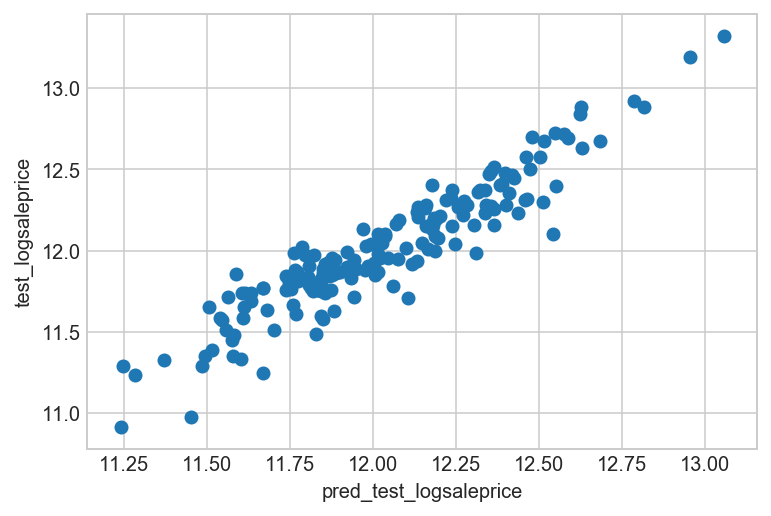

In [46]:
y_test_pred = ridge.predict(X_test_ss)
plt.scatter(y_test_pred, y_test)
plt.ylabel('test_logsaleprice')
plt.xlabel('pred_test_logsaleprice');

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovate-able features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

## Step 1: Get unexplained sale price (y mins y_pred)

In [47]:
#get entire dataset
X = pd.concat([X_train_sel, X_test_sel])
X_ss = StandardScaler().fit_transform(X)
y = pd.concat([y_train, y_test])

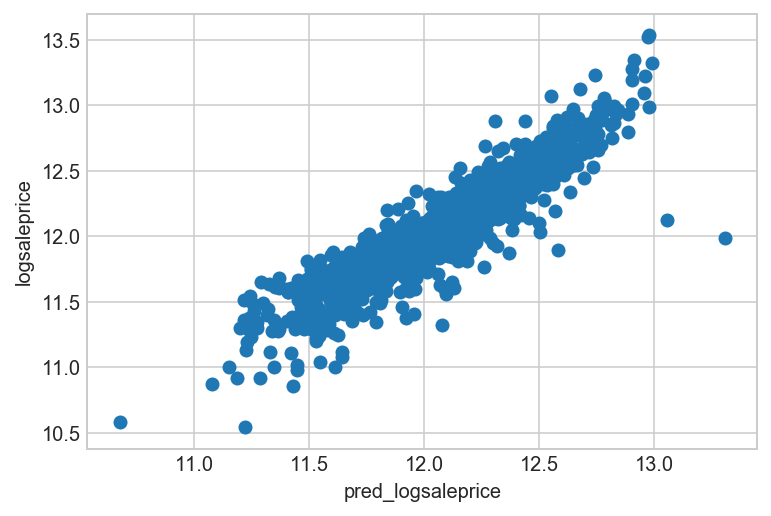

In [48]:
#predict and get unexplained price difference
ridge = Ridge(alpha=optimal_ridge.alpha_).fit(X_train_ss, y_train)
y_pred = ridge.predict(X_ss)
plt.scatter(y_pred, y)
plt.ylabel('logsaleprice')
plt.xlabel('pred_logsaleprice');

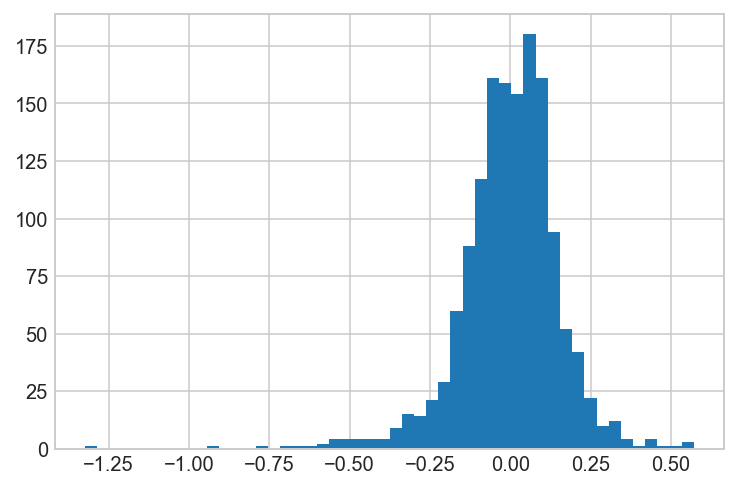

In [49]:
#new target variable
unexp_price = y - y_pred
unexp_price.hist(bins=50)
#a few outliers present to be explained by renovatable features hopefully

In [50]:
#new dataset for renovatable features
df_etc = df_clean.iloc[:,df_clean.columns.isin(FF)==False]
df_etc['YrSold'] = df_clean['YrSold']
df_etc['unexp_price'] = unexp_price
df_etc.head()

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,...,GarageType,GarageQual,GarageCond,PoolQC,OverallQual,OverallCond,log_BsmtFinSF1,log_BsmtUnfSF,YrSold,unexp_price
0,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,...,Attchd,TA,TA,not_pres,7,5,6.561031,5.017280,2008,0.050088
1,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,...,Attchd,TA,TA,not_pres,6,8,6.886532,5.652489,2007,0.010730
2,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,...,Attchd,TA,TA,not_pres,7,5,6.188264,6.075346,2008,-0.000547
3,Gable,CompShg,Wd Sdng,Others,None,TA,TA,BrkTil,TA,Others,...,Detchd,TA,TA,not_pres,7,5,5.379897,6.293419,2006,-0.318793
4,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,...,Attchd,TA,TA,not_pres,8,5,6.486161,6.196444,2008,-0.083094


In [51]:
df_etc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1442 entries, 0 to 1459
Data columns (total 29 columns):
RoofStyle         1442 non-null object
RoofMatl          1442 non-null object
Exterior1st       1442 non-null object
Exterior2nd       1442 non-null object
MasVnrType        1442 non-null object
ExterQual         1442 non-null object
ExterCond         1442 non-null object
Foundation        1442 non-null object
BsmtQual          1442 non-null object
BsmtCond          1442 non-null object
BsmtFinType1      1442 non-null object
BsmtFinType2      1442 non-null object
Heating           1442 non-null object
HeatingQC         1442 non-null object
CentralAir        1442 non-null object
Electrical        1442 non-null object
KitchenQual       1442 non-null object
Functional        1442 non-null object
FireplaceQu       1442 non-null object
GarageType        1442 non-null object
GarageQual        1442 non-null object
GarageCond        1442 non-null object
PoolQC            1442 non-null obj

## Step 2: Exploratory analysis and Feature Selection (cleaning has been done already)

In [52]:
#Explore object and numeric columns separately
objdf_etc = df_etc.select_dtypes('O')
numdf_etc = df_etc.select_dtypes(include=np.number)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


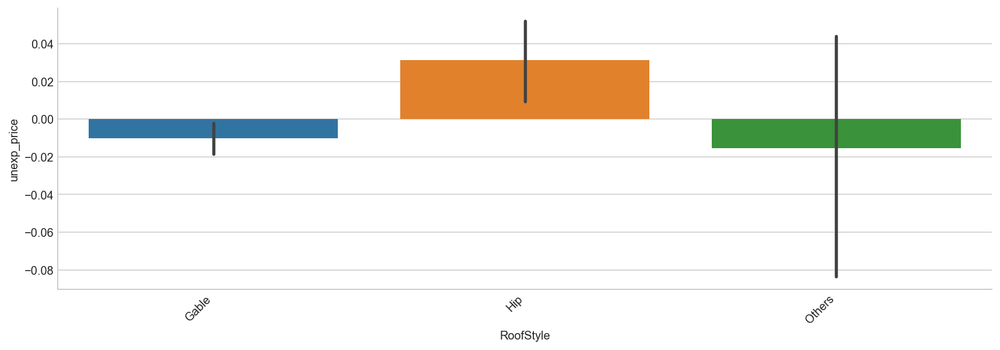

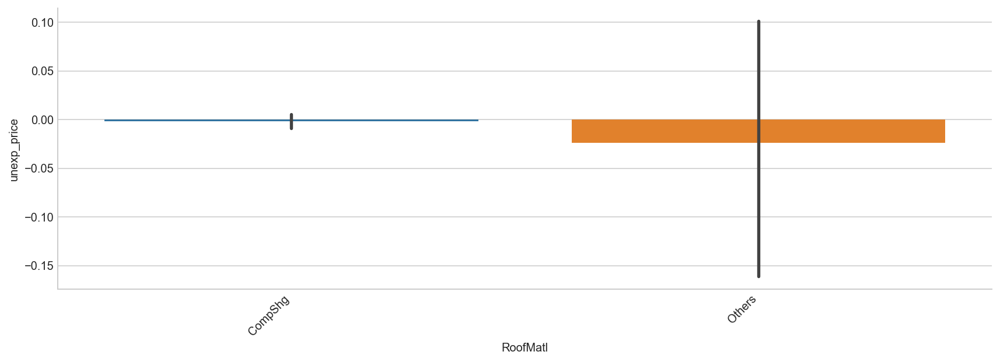

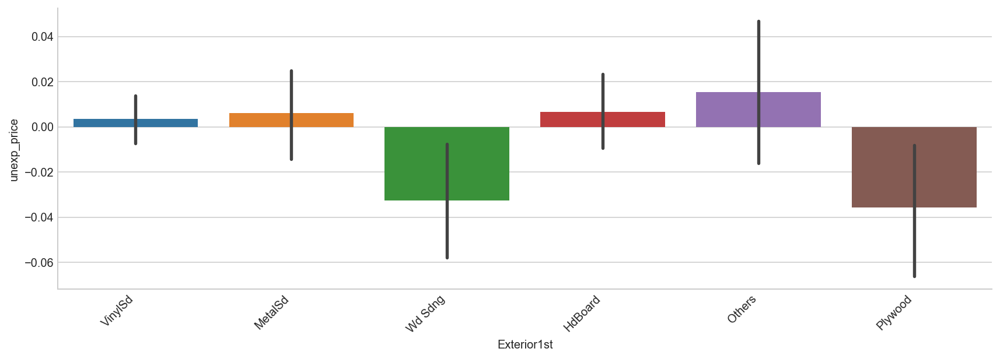

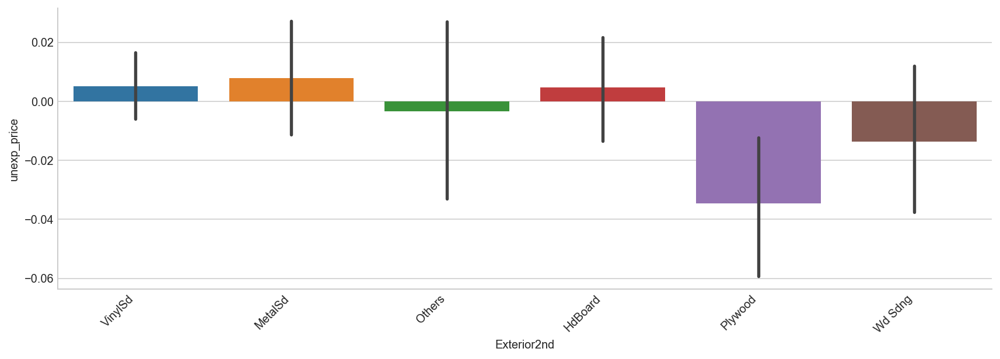

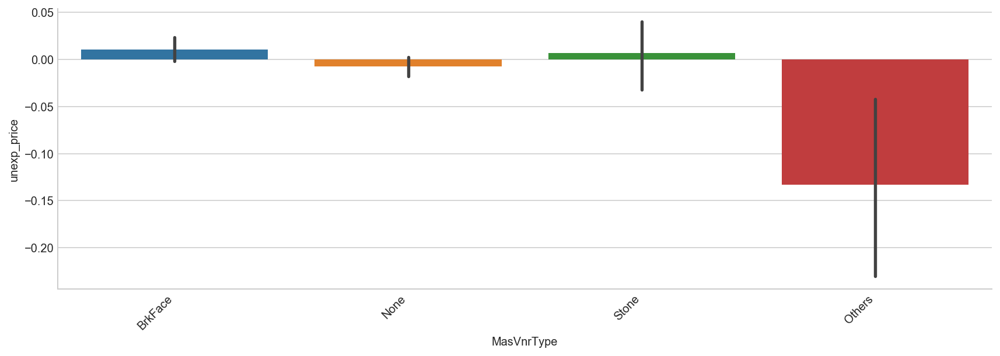

...

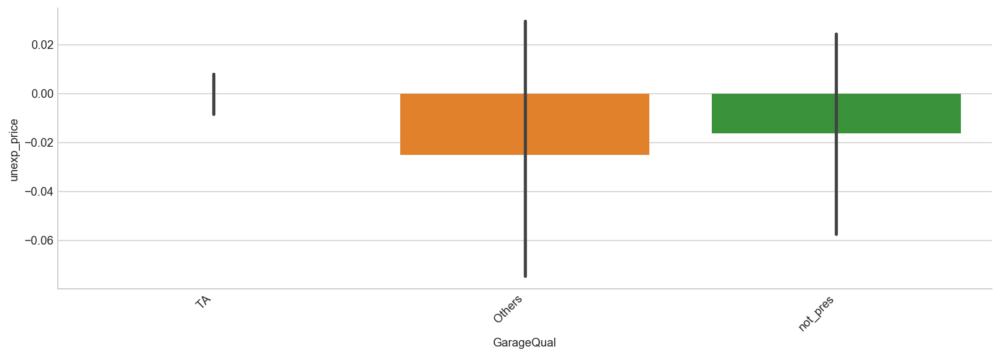

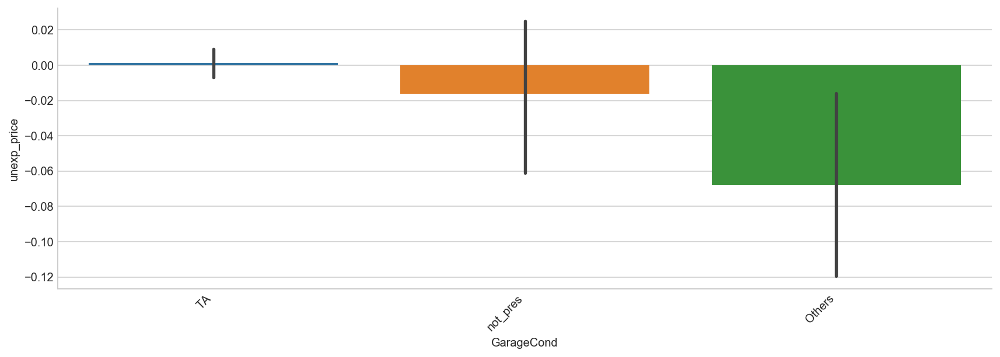

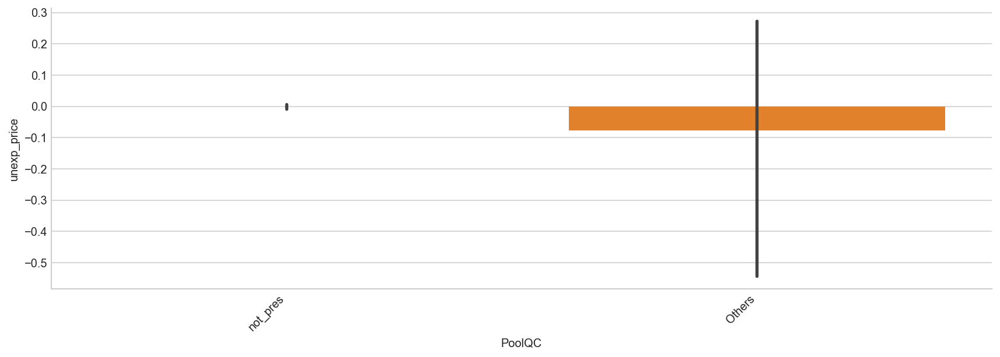

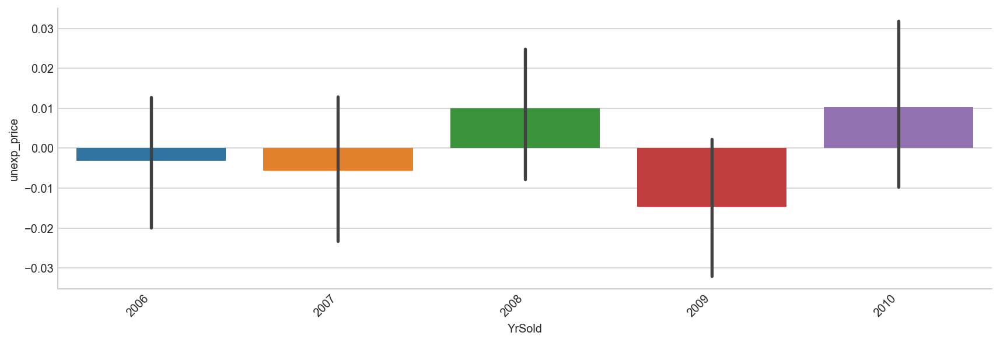

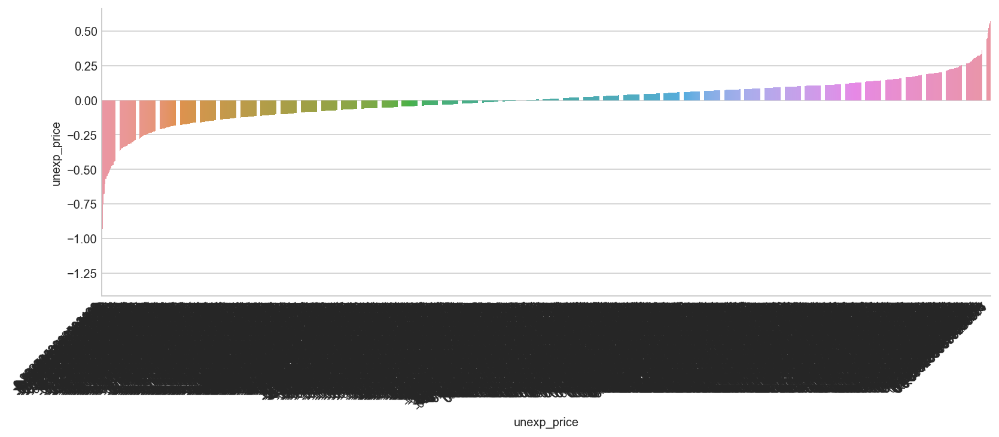

In [53]:
#Use factor plot to check whether unexplained prices differs across categories of object variables.
#mean difference present for most predictor factors but high mean error as well
objdf_etc['unexp_price'] = numdf_etc['unexp_price']
for c in objdf_etc.columns:
    sns.factorplot(x=c, y='unexp_price', data=objdf_etc, kind='bar', aspect=3).set_xticklabels(rotation=45, horizontalalignment='right')

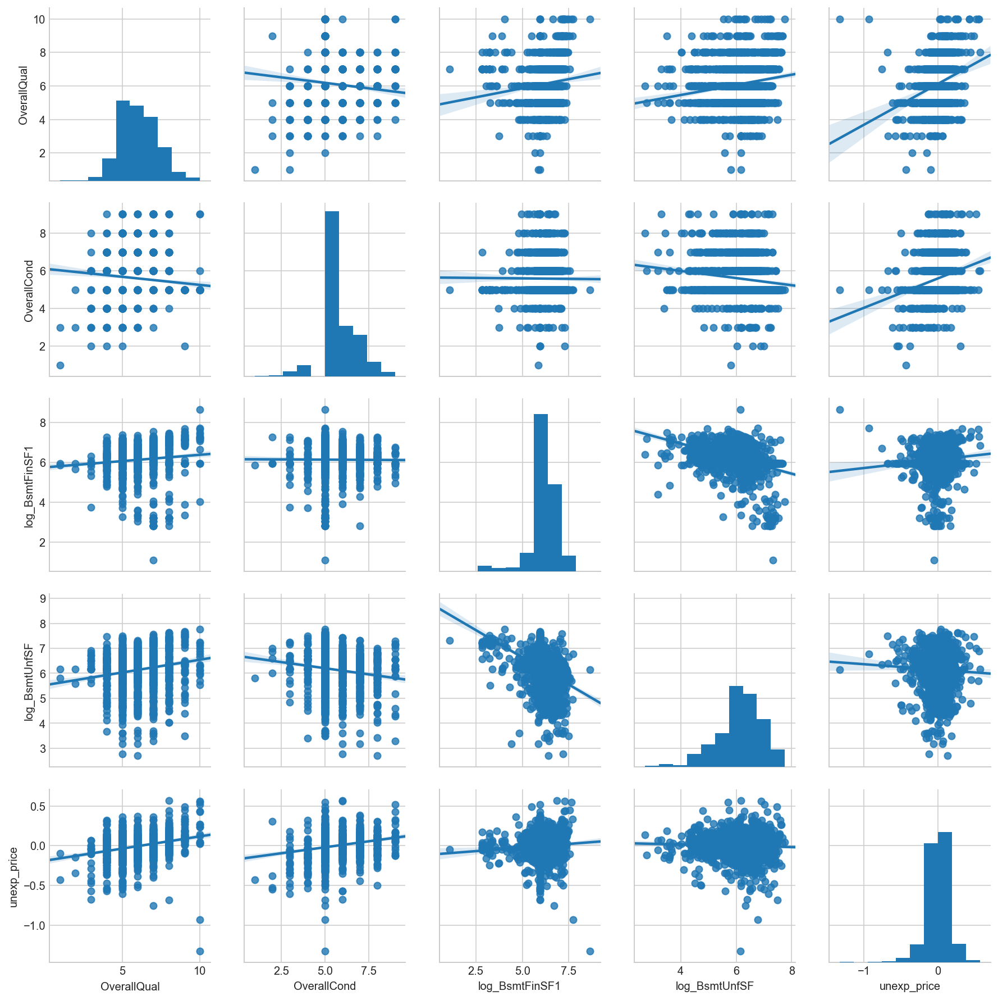

In [54]:
#check for scatterplot relationships for numeric variables with unexplained price
sns.pairplot(numdf_etc, kind="reg")
#observe the last row. Log-linear relationship is present for overall quality and condition.

In [55]:
#split numdf_ff into ordered and logged variables
numdf_etc.columns

Index([u'OverallQual', u'OverallCond', u'log_BsmtFinSF1', u'log_BsmtUnfSF',
       u'unexp_price'],
      dtype='object')

In [56]:
#numeric variable correlation with unexplained price
corr = numdf_etc.corr().unstack().reset_index()
corr['abs'] = corr[0].abs()
corr[(corr[0] != 1.0) & (corr['level_0'] == 'unexp_price')].sort_values('abs', ascending=False)
#low correlation

,level_0,level_1,0,abs
20,unexp_price,OverallQual,0.273851,0.273851
21,unexp_price,OverallCond,0.216681,0.216681
22,unexp_price,log_BsmtFinSF1,0.087054,0.087054
23,unexp_price,log_BsmtUnfSF,-0.042435,0.042435


### Feature Selection

In [57]:
#get dummies into new dataframe
dummies = pd.get_dummies(objdf_etc.drop(['YrSold', 'unexp_price'], axis=1), drop_first = True)
dummies.head()
df_etc_dum = dummies.merge(numdf_etc, left_index = True, right_index = True,how = 'outer')#merge back
df_etc_dum['YrSold'] = objdf_etc['YrSold']
print df_ff_dum.shape
df_etc_dum.head()

(1442, 88)


,RoofStyle_Hip,RoofStyle_Others,RoofMatl_Others,Exterior1st_MetalSd,Exterior1st_Others,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_MetalSd,Exterior2nd_Others,...,GarageQual_not_pres,GarageCond_TA,GarageCond_not_pres,PoolQC_not_pres,OverallQual,OverallCond,log_BsmtFinSF1,log_BsmtUnfSF,unexp_price,YrSold
0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,1,7,5,6.561031,5.017280,0.050088,2008
1,0,0,0,1,0,0,0,0,1,0,...,0,1,0,1,6,8,6.886532,5.652489,0.010730,2007
2,0,0,0,0,0,0,1,0,0,0,...,0,1,0,1,7,5,6.188264,6.075346,-0.000547,2008
3,0,0,0,0,0,0,0,1,0,1,...,0,1,0,1,7,5,5.379897,6.293419,-0.318793,2006
4,0,0,0,0,0,0,1,0,0,0,...,0,1,0,1,8,5,6.486161,6.196444,-0.083094,2008


In [58]:
#get train test datasets
X_train = df_etc_dum[df_etc_dum['YrSold'] != 2010]
X_train.drop(['unexp_price','YrSold'], axis=1, inplace=True)
X_test = df_etc_dum[df_etc_dum['YrSold'] == 2010]
X_test.drop(['unexp_price','YrSold'], axis=1, inplace=True)

y_train = df_etc_dum[df_etc_dum['YrSold'] != 2010]['unexp_price']
y_test = df_etc_dum[df_etc_dum['YrSold'] == 2010]['unexp_price']

#standardising
X_train_ss = StandardScaler().fit_transform(X_train)
X_test_ss = StandardScaler().fit_transform(X_test)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [59]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import RFECV
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score

#f-test
selector=SelectKBest(score_func=f_classif,k=10) #select k predictors from f-test
selector.fit(X_train_ss,y_train)
list(zip(X_train.columns.values, selector.scores_, selector.pvalues_)) #print variable, F-test value & p-value
X_f_col = np.array(X_train.columns[selector.get_support(True)]) #select chosen column, true gives column index
print 'X_f_col,', X_f_col 

#Recursive feature elimination
estimator = LinearRegression()
selector = RFECV(estimator, step=1, cv=10)
selector = selector.fit(X_train_ss, y_train)
list(zip(X_train.columns.values, selector.support_, selector.ranking_)) #print variables, selection and ranks -> rank 1 is the best
X_RFECV_col = np.array(X_train.columns[selector.support_]) #select chosen column from TRUE
print 'X_RFECV_col:',X_RFECV_col

#lasso
optimal_lasso = LassoCV(n_alphas=500, cv=10) #LassoCV decide what alphas to use, just set no. of alphas to test.
optimal_lasso.fit(X_train_ss, y_train)
coefs = list(zip(X_train.columns.values, optimal_lasso.coef_))
coefs = pd.DataFrame.from_records(coefs)
coefs['abs'] = abs(coefs[1])
X_lasso_col = coefs[coefs['abs'] != 0].sort_values('abs', ascending=False).head(10)
X_lasso_col = np.array(X_lasso_col.iloc[:,0])
print 'X_lasso_col:', X_RFECV_col

#common features selected for explanation
sel = list(X_RFECV_col)
for e in list(X_f_col):
    sel.append(e)
for e in list(X_lasso_col):
    sel.append(e)
from collections import Counter
sel_fea = pd.DataFrame.from_dict(Counter(sel), orient='index').reset_index()
print sel_fea.sort_values(0,ascending=False)

#common features OverallQual, OverallCond, PoolQC, Functional, BsmtFinType1

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\sklearn\feature_selection\univariate_selection.py:109: RuntimeWarning: invalid value encountered in divide
  msw = sswn / float(dfwn)


X_f_col, ['GarageType_not_pres' 'GarageQual_TA' 'GarageQual_not_pres'
 'GarageCond_TA' 'GarageCond_not_pres' 'PoolQC_not_pres' 'OverallQual'
 'OverallCond' 'log_BsmtFinSF1' 'log_BsmtUnfSF']
X_RFECV_col: ['Exterior1st_Wd Sdng' 'Exterior2nd_Wd Sdng' 'BsmtFinType1_Unf'
 'Functional_Typ' 'OverallQual' 'OverallCond']
X_lasso_col: ['Exterior1st_Wd Sdng' 'Exterior2nd_Wd Sdng' 'BsmtFinType1_Unf'
 'Functional_Typ' 'OverallQual' 'OverallCond']
                   index  0
9            OverallQual  3
12           OverallCond  3
2        PoolQC_not_pres  2
8         Functional_Typ  2
10      BsmtFinType1_Unf  2
11   Exterior1st_Wd Sdng  1
17     BsmtQual_not_pres  1
16         log_BsmtUnfSF  1
15         GarageCond_TA  1
14      MasVnrType_Stone  1
13         GarageQual_TA  1
0    GarageCond_not_pres  1
1         log_BsmtFinSF1  1
7    GarageQual_not_pres  1
6           CentralAir_Y  1
5      GarageType_Others  1
4   FireplaceQu_not_pres  1
3    Exterior2nd_Wd Sdng  1
18   GarageType_not_pres  1


In [60]:
#get selected columns
PoolQC_cols = [c for c in X_train.columns if 'PoolQC' in c]
Functional_cols = [c for c in X_train.columns if 'Functional' in c]
BsmtFinType1_cols = [c for c in X_train.columns if 'BsmtFinType1' in c]

sel_cols = ['OverallQual', 'OverallCond']
sel_cols = sel_cols + PoolQC_cols + Functional_cols + BsmtFinType1_cols
print 'selected columns:',len(sel_cols)
X_train_sel = X_train[sel_cols]

selected columns: 10


In [61]:
#check for coefficient significance and interpret variable effects
# http://www.cazaar.com/ta/econ113/interpreting-beta
import statsmodels.formula.api as sm
X = np.concatenate([X_train_sel, np.ones((X_train_sel.shape[0], 1))], axis=1)
y = y_train
model = sm.OLS(y, X)
model = model.fit()
model.summary(xname = X_train_sel.columns.values.tolist() + ['const'])

#The model explains 20% of the variation in unexplained prices, coefficients are statistically significant.
#Interpretation as follows:
#For non-log variables: 1 unit increase in predictor increases saleprice by (100*coef)%. For eg. increase in overall quality by 1 increases 3.5% of sale price.
#For dummy variables: the presence of predictor increases saleprice by (100*coef)%, relative to baseline (dropped dummy). For eg. unfinished basement gives a 5.6% lower sale price than (baseline) average quality basement.

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            unexp_price   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.192
Method:                 Least Squares   F-statistic:                     31.24
Date:                Thu, 05 Jul 2018   Prob (F-statistic):           2.64e-54
Time:                        18:14:03   Log-Likelihood:                 706.13
No. Observations:                1271   AIC:                            -1390.
Df Residuals:                    1260   BIC:                            -1334.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
OverallQual               0.0350      0.003     10.453      0.000       0.028       0.042
OverallCond               0.0353      0.004      9.515      0.000       0.028       0.043
PoolQC_not_pres           0.1329      0.053      2.503      0.012       0.029       0.237
Functional_Typ            0.0990      0.016      6.087      0.000       0.067       0.131
BsmtFinType1_BLQ          0.0070      0.016      0.440      0.660      -0.024       0.038
BsmtFinType1_GLQ         -0.0143      0.014     -1.043      0.297      -0.041       0.013
BsmtFinType1_LwQ         -0.0158      0.020     -0.778      0.437      -0.055       0.024
BsmtFinType1_Rec          0.0034      0.016      0.205      0.837      -0.029       0.035
BsmtFinType1_Unf         -0.0569      0.013     -4.506      0.000      -0.082      -0.032
BsmtFinType1_not_pres     0.0778      0.027      2.846      0.005       0.024       0.131
const                    -0.6201      0.063     -9.859      0.000      -0.743      -0.497
==============================================================================
Omnibus:                      457.569   Durbin-Watson:                   1.946
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6197.699
Skew:                          -1.279   Prob(JB):                         0.00
Kurtosis:                      13.511   Cond. No.                         174.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

1. Evaluate the effect in dollars of the renovate-able features. 
        An increase in overall quality rating by 1, improves prices by 3.5%
        An increase in overall condition rating by 1, improves prices by 3.5%.
        Having good quality pools do not improve prices.
        Unfinished basement gives a 5.6% lower sale price than (baseline) average quality basement.
     
2. How would your company use this second model and its coefficients to determine whether they should buy a property or not?
        If the cost of renovation to improve property quality and condition is low (less than 3.5% of property value), they can purchase the property. 
        Perceived qualities like a good pool does not improve prices, the compamy should not buy expensive houses with pool. While unfinished basement is worse-off than an average quality basement. If renovating the unfinished basement is costly, do not purchase the house. 
        
3. Explain how the company can use the two models you have built to determine if they can make money.
        First check the predicted property price based on the fixed features. If the company is able to purchase at a lower 
        price relative to the predicted price, they can make money. 
        Secondly, measuring the marginal profit from quality/condition improvement (3.5% of sale price)against what they will need to spend to achieve it.
        
4. Investigate how much of the variance in price remaining is explained by these features.
        R square of 0.2. Only 2 percent of remaining price variance is explained by these features.
        
5. Do you trust your model? Should it be used to evaluate which properties to buy and fix up?
        Only fixed effects should be used. The renovate-able features model is not a good model fit.

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. I recommend doing some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [62]:
df_clean['SaleCondition'].value_counts()/len(df)
#Abnormal makes up only 6.7% of the dataframe

Normal     0.825243
Partial    0.084605
Abnorml    0.066574
Others     0.023578
Name: SaleCondition, dtype: float64

In [63]:
#Making new classifier
df_ab = df_clean
df_ab['Abnormal'] = (df_ab['SaleCondition'] == 'Abnorml')*1
df_ab = df_ab.drop('SaleCondition', axis=1)
df_ab[['LotFrontage_pres','MasVnrArea_pres','2ndFlrSF_pres','LowQualFinSF_pres','WoodDeckSF_pres','OpenPorchSF_pres',]] = df_ab[['LotFrontage_pres','MasVnrArea_pres','2ndFlrSF_pres','LowQualFinSF_pres','WoodDeckSF_pres','OpenPorchSF_pres',]].astype('object')

In [64]:
#Classify category and continuous columns
objdf_ab = df_ab.select_dtypes('O')
numdf_ab = df_ab.select_dtypes(include=np.number)
objdf_ab['Abnormal'] = df_ab['Abnormal']

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


In [65]:
objdf_ab.columns

Index([u'MSSubClass', u'MSZoning', u'Street', u'Alley', u'LotShape',
       u'LandContour', u'Utilities', u'LotConfig', u'LandSlope',
       u'Neighborhood', u'Condition1', u'Condition2', u'BldgType',
       u'HouseStyle', u'RoofStyle', u'RoofMatl', u'Exterior1st',
       u'Exterior2nd', u'MasVnrType', u'ExterQual', u'ExterCond',
       u'Foundation', u'BsmtQual', u'BsmtCond', u'BsmtExposure',
       u'BsmtFinType1', u'BsmtFinType2', u'Heating', u'HeatingQC',
       u'CentralAir', u'Electrical', u'KitchenQual', u'Functional',
       u'FireplaceQu', u'GarageType', u'GarageFinish', u'GarageQual',
       u'GarageCond', u'PavedDrive', u'PoolQC', u'Fence', u'MiscFeature',
       u'MoSold', u'YrSold', u'SaleType', u'LotFrontage_pres',
       u'MasVnrArea_pres', u'2ndFlrSF_pres', u'LowQualFinSF_pres',
       u'WoodDeckSF_pres', u'OpenPorchSF_pres', u'Abnormal'],
      dtype='object')

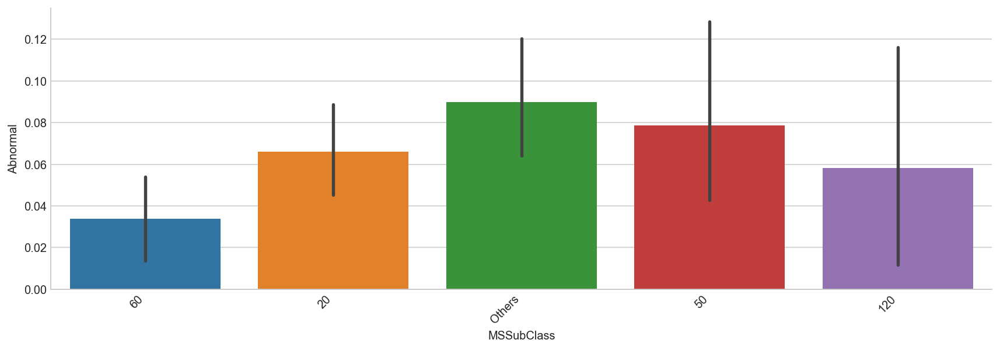

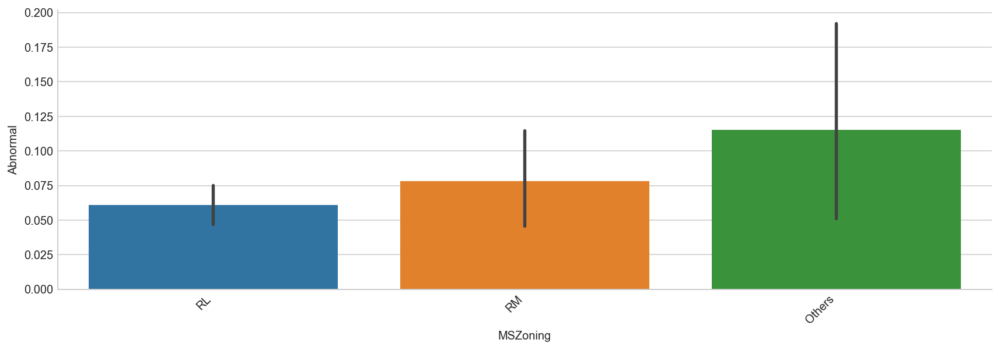

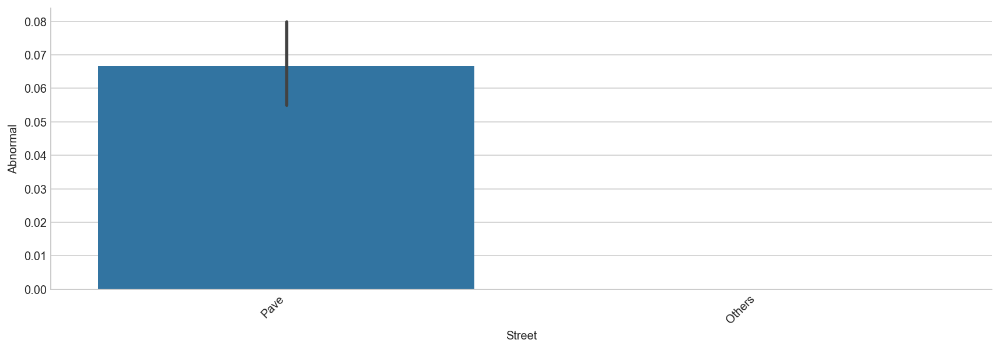

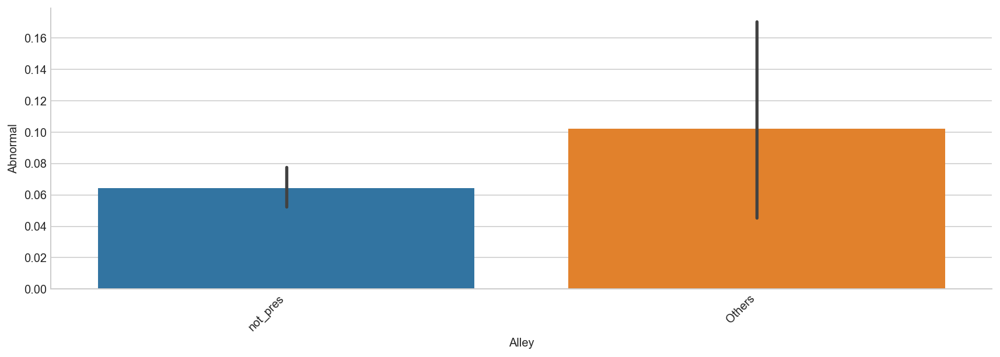

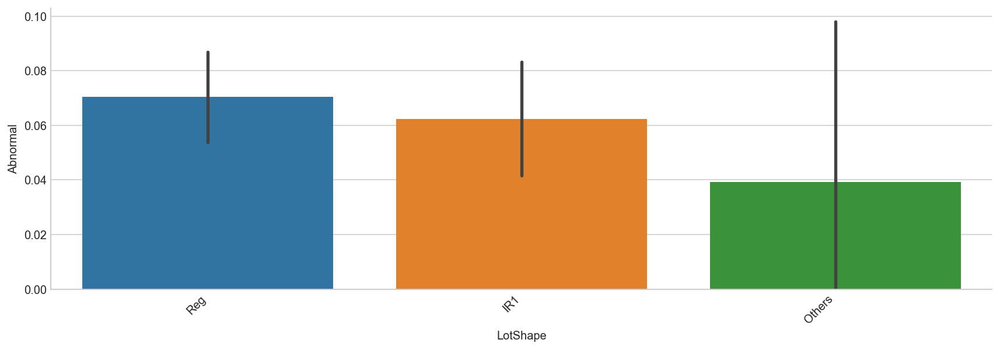

...

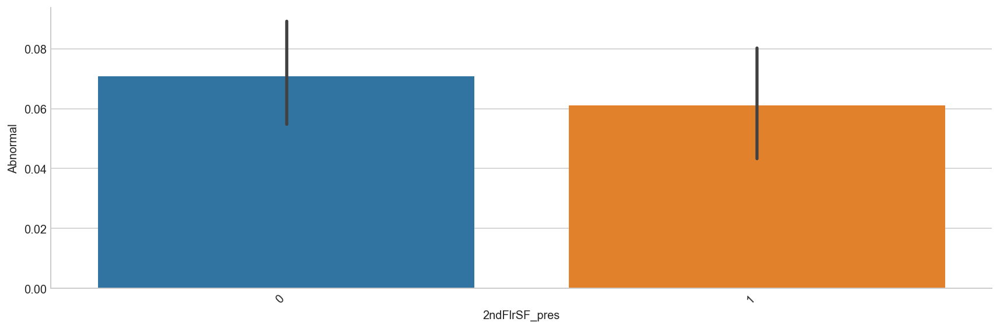

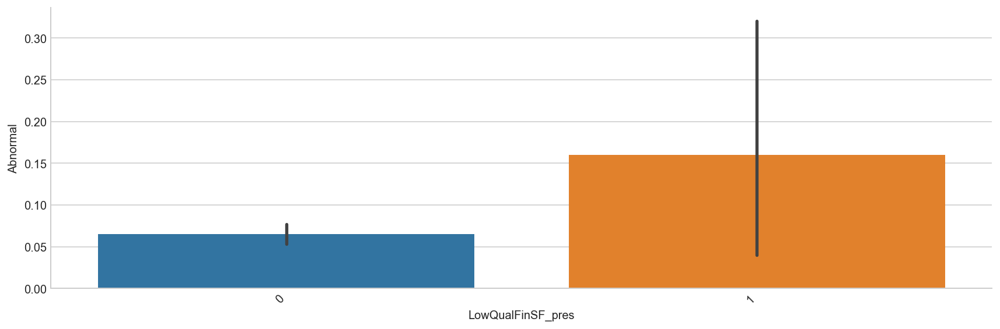

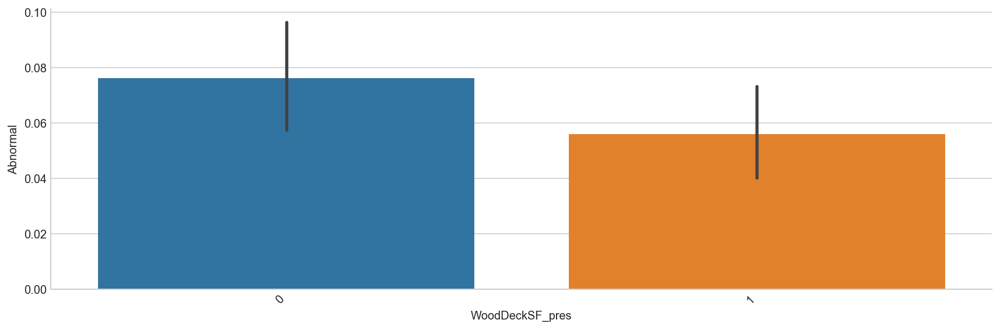

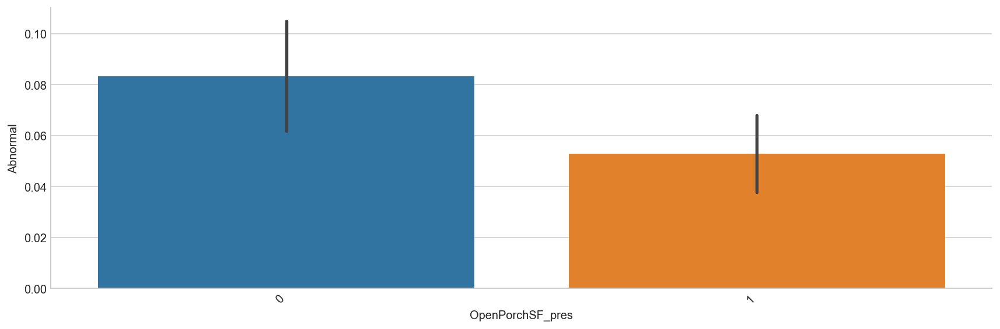

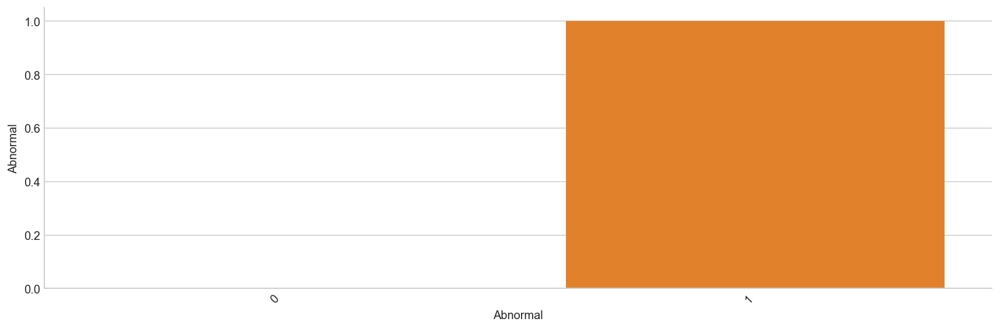

In [66]:
#exploring object columns
for c in objdf_ab.columns:
    sns.factorplot(x=c, y='Abnormal', data=objdf_ab, kind='bar', aspect=3).set_xticklabels(rotation=45, horizontalalignment='right')
    plt.ylim()
#difference present but with high mean error

In [67]:
numdf_ab.columns

Index([u'OverallQual', u'OverallCond', u'BsmtFullBath', u'BsmtHalfBath',
       u'FullBath', u'HalfBath', u'BedroomAbvGr', u'KitchenAbvGr',
       u'TotRmsAbvGrd', u'Fireplaces', u'GarageCars', u'YearBuilt_tosale',
       u'YearRemodAdd_tosale', u'GarageYrBlt_tosale', u'log_LotFrontage',
       u'log_LotArea', u'log_BsmtFinSF1', u'log_BsmtUnfSF', u'log_TotalBsmtSF',
       u'log_1stFlrSF', u'log_GrLivArea', u'log_GarageArea',
       u'log_OpenPorchSF', u'log_SalePrice', u'Abnormal'],
      dtype='object')

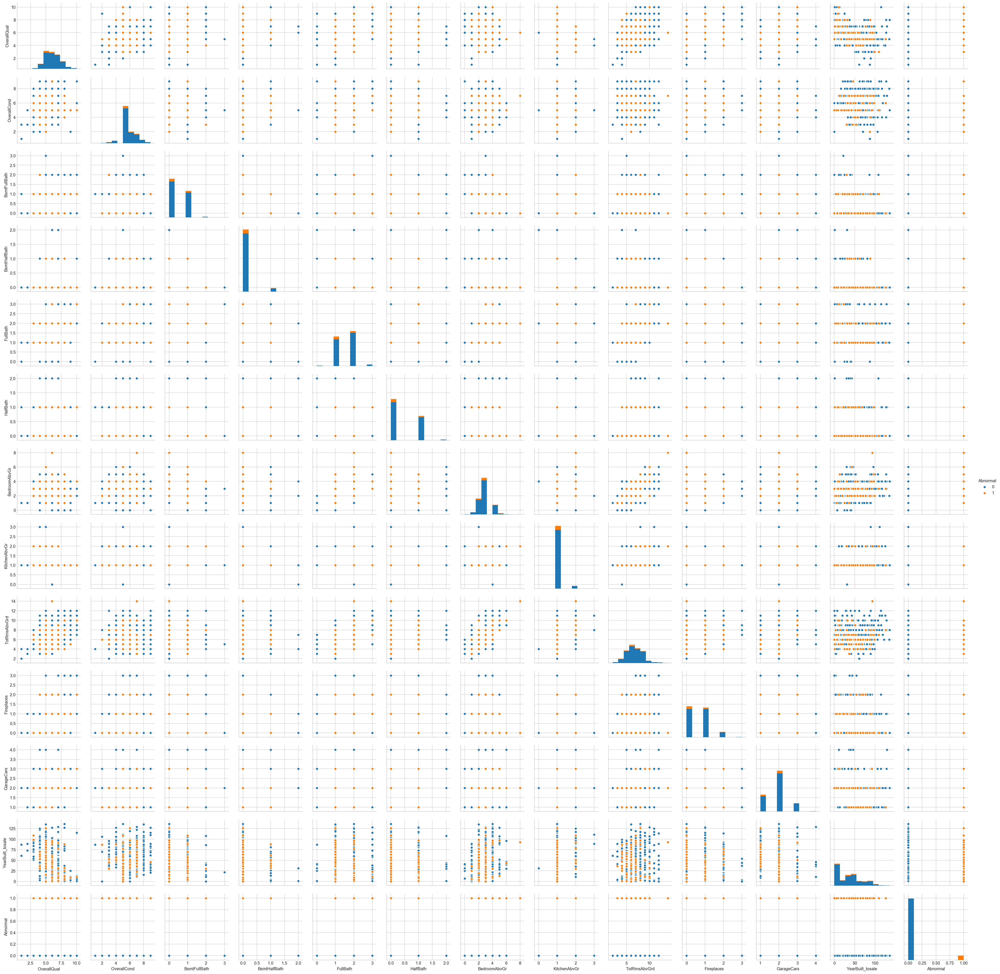

In [68]:
#exploring numeric columns 1 to 12
sns.pairplot(numdf_ab.drop(numdf_ab.columns[12:24], axis=1), hue='Abnormal')
#no obvious clusters

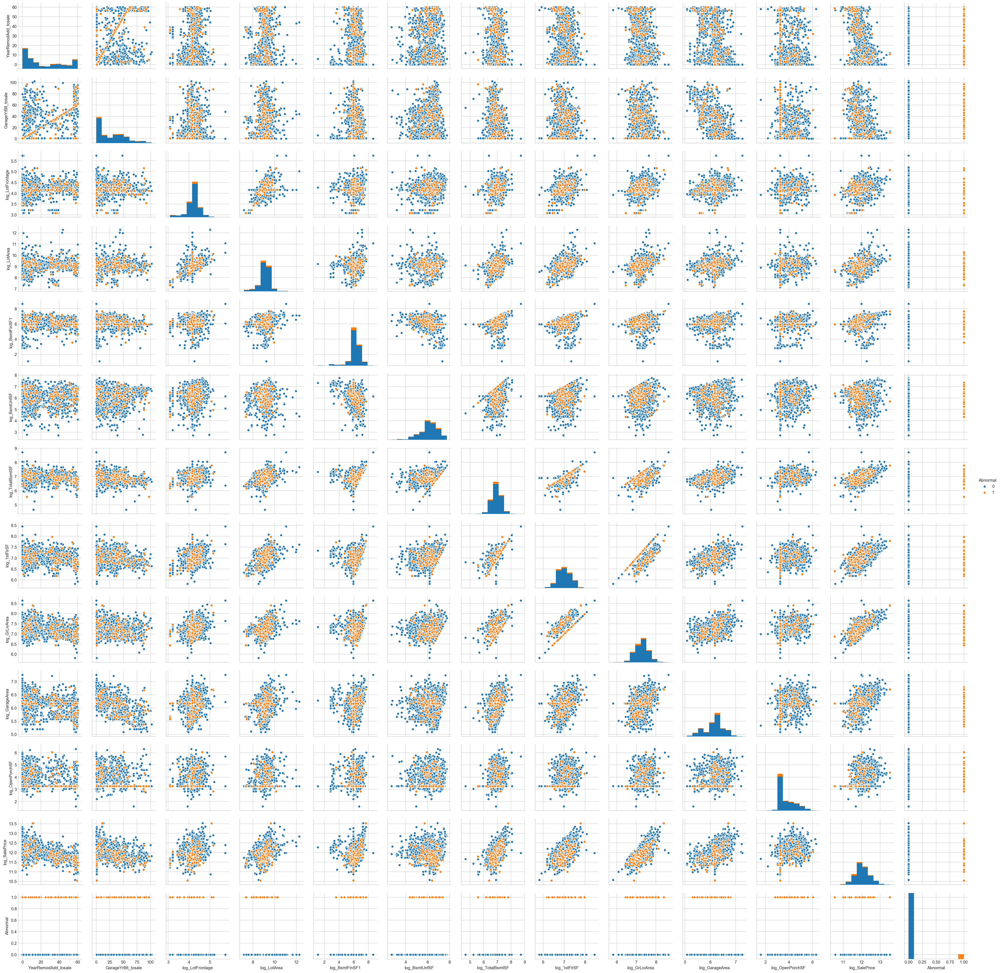

In [69]:
#exploring numeric columns 12 to rest
sns.pairplot(numdf_ab.iloc[:,12:], hue='Abnormal')
#no obvious clusters, abnormal sales are within the distribution

## Solution 1: Sample minority class with replacement to match majority class. This allows the model to learn more from the Abnormal class attributes

In [70]:
#get dummies into new dataframe
dummies = pd.get_dummies(objdf_ab.drop(['YrSold', 'Abnormal'], axis=1), drop_first = True)
dummies.head()
df_ab_dum = dummies.merge(numdf_ab, left_index = True, right_index = True,how = 'outer')#merge back
df_ab_dum['YrSold'] = objdf_ab['YrSold']
print df_ab_dum.shape
df_ab_dum.head()

(1442, 151)


,MSSubClass_50,MSSubClass_60,MSSubClass_120,MSSubClass_Others,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_not_pres,LotShape_Others,LotShape_Reg,...,log_BsmtFinSF1,log_BsmtUnfSF,log_TotalBsmtSF,log_1stFlrSF,log_GrLivArea,log_GarageArea,log_OpenPorchSF,log_SalePrice,Abnormal,YrSold
0,0,1,0,0,1,0,1,1,0,1,...,6.561031,5.017280,6.753438,6.753438,7.444833,6.308098,4.127134,12.247699,0,2008
1,0,0,0,0,1,0,1,1,0,1,...,6.886532,5.652489,7.141245,7.141245,7.141245,6.133398,3.258097,12.109016,0,2007
2,0,1,0,0,1,0,1,1,0,0,...,6.188264,6.075346,6.825460,6.825460,7.488294,6.411818,3.761200,12.317171,0,2008
3,0,0,0,1,1,0,1,1,0,0,...,5.379897,6.293419,6.629363,6.869014,7.448916,6.466145,3.583519,11.849405,1,2006
4,0,1,0,0,1,0,1,1,0,0,...,6.486161,6.196444,7.044033,7.044033,7.695758,6.729824,4.442651,12.429220,0,2008


In [71]:
df_majority = df_ab_dum[df_ab_dum.Abnormal==0] #1346 samples
df_minority = df_ab_dum[df_ab_dum.Abnormal==1] #96 samples

In [72]:
from sklearn.utils import resample
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=1346,    # to match majority class
                                 random_state=123)

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# Display new class counts percentage
df_upsampled.Abnormal.value_counts()/len(df_upsampled)

1    0.5
0    0.5
Name: Abnormal, dtype: float64

In [73]:
#get train test datasets
X_train = df_upsampled[df_upsampled['YrSold'] != 2010]
X_train.drop(['Abnormal','YrSold'], axis=1, inplace=True)
X_test = df_upsampled[df_upsampled['YrSold'] == 2010]
X_test.drop(['Abnormal','YrSold'], axis=1, inplace=True)

y_train = df_upsampled[df_upsampled['YrSold'] != 2010]['Abnormal']
y_test = df_upsampled[df_upsampled['YrSold'] == 2010]['Abnormal']

#standardising
X_train_ss = StandardScaler().fit_transform(X_train)
X_test_ss = StandardScaler().fit_transform(X_test)

C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Samson\AppData\Local\Continuum\anaconda2\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [74]:
X_train_ss

array([[-0.33719417,  2.33654862, -0.24081167, ...,  0.51041161,
         0.51497449,  0.74064172],
       [-0.33719417, -0.42798168, -0.24081167, ...,  0.01453653,
        -0.72171733,  0.40033252],
       [-0.33719417,  2.33654862, -0.24081167, ...,  0.8048132 ,
        -0.00577144,  0.91111707],
       ...,
       [ 2.96565034, -0.42798168, -0.24081167, ...,  0.1232557 ,
         1.18094525, -1.61300074],
       [-0.33719417, -0.42798168, -0.24081167, ...,  1.56489094,
        -1.32635103,  1.03423723],
       [-0.33719417, -0.42798168, -0.24081167, ..., -0.96028827,
        -0.72171733, -0.86264011]])

### Feature Selection

In [75]:
from sklearn.feature_selection import SelectKBest, chi2, f_classif 
from sklearn.feature_selection import RFECV
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegressionCV

# Build the selector — we'll build one with each score type.
skb_f = SelectKBest(f_classif, k=10)
skb_chi2 = SelectKBest(chi2, k=10)
# Train the selector on the data.
skb_f.fit(X_train,y_train)
skb_chi2.fit(X_train,y_train)
kbest = pd.DataFrame([X_train.columns.values, list(skb_f.scores_), list(skb_chi2.scores_)], 
                     index=['feature','f_classif','chi2 score']).T.sort_values('chi2 score', ascending=False)
X_f_col = X_train.columns[skb_f.get_support(True)]
X_chi2_col = X_train.columns[skb_chi2.get_support(True)]
print kbest.head(10)

#Recursive feature elimination
estimator = LinearRegression()
selector = RFECV(estimator, step=1, cv=10)
selector = selector.fit(X_train_ss, y_train)
list(zip(X_train.columns.values, selector.support_, selector.ranking_)) #print variables, selection and ranks -> rank 1 is the best
X_RFECV_col = np.array(X_train.columns[selector.support_]) #select chosen column from TRUE
print 'X_RFECV_col:',X_RFECV_col

#Lasso
lrcv = LogisticRegressionCV(penalty='l1', Cs=50, cv=5, solver='liblinear')
optimal_lasso = lrcv.fit(X_train_ss, y_train)
coefs = pd.DataFrame(optimal_lasso.coef_, columns=X_train.columns).T
coefs['abs'] = abs(coefs[0])
X_lasso_col = coefs[coefs['abs'] != 0].sort_values('abs', ascending=False).head(10)
X_lasso_col = np.array(X_lasso_col.index)
print 'X_lasso_col:', X_lasso_col

                  feature f_classif chi2 score
137   YearRemodAdd_tosale   150.194    2208.06
136      YearBuilt_tosale   72.7859    1564.78
138    GarageYrBlt_tosale   37.3505    798.085
117       SaleType_Others   424.679    296.237
20   Neighborhood_NridgHt   73.4224    69.2635
134            Fireplaces   82.3619     60.114
1           MSSubClass_60   69.5257    57.1477
17   Neighborhood_Gilbert   50.7515    48.0305
48       MasVnrType_Stone   51.1716     47.203
110              MoSold_6   55.1505    47.0658
X_RFECV_col: ['MSZoning_RL' 'MSZoning_RM' 'Exterior1st_VinylSd' 'Exterior1st_Wd Sdng'
 'Exterior2nd_VinylSd' 'Exterior2nd_Wd Sdng' 'MasVnrType_None'
 'BsmtCond_not_pres' 'KitchenQual_Gd' 'KitchenQual_Others'
 'KitchenQual_TA' 'FireplaceQu_Others' 'FireplaceQu_TA' 'SaleType_Others'
 'SaleType_WD' 'MasVnrArea_pres_1' 'Fireplaces' 'YearRemodAdd_tosale'
 'log_1stFlrSF' 'log_SalePrice']
X_lasso_col: ['SaleType_Others' 'log_SalePrice' 'SaleType_WD' 'Exterior1st_VinylSd'
 'KitchenQual_

In [76]:
#common features selected for explanation
sel = list(X_RFECV_col)
for e in list(X_f_col):
    sel.append(e)
for e in list(X_chi2_col):
    sel.append(e)
for e in list(X_lasso_col):
    sel.append(e)
from collections import Counter
sel_fea = pd.DataFrame.from_dict(Counter(sel), orient='index').reset_index()
print sel_fea.sort_values(0,ascending=False)
#SaleType, Fireplaces, YearRemodAdd_tosale, log_SalePrice, Neighborhood, Exterior1st, KitchenQual

                   index  0
6        SaleType_Others  4
9             Fireplaces  3
26      YearBuilt_tosale  3
8            SaleType_WD  3
19   YearRemodAdd_tosale  3
11         log_SalePrice  3
28  Neighborhood_NridgHt  2
3    Exterior1st_Wd Sdng  2
4            MSZoning_RM  2
27         MSSubClass_60  2
10        KitchenQual_TA  2
22   Exterior1st_VinylSd  2
14        KitchenQual_Gd  2
23    FireplaceQu_Others  1
21          log_1stFlrSF  1
0    Neighborhood_Others  1
24   Exterior2nd_VinylSd  1
25     BsmtCond_not_pres  1
20       MasVnrType_None  1
15        FireplaceQu_TA  1
18  FireplaceQu_not_pres  1
17     MasVnrArea_pres_1  1
16      MasVnrType_Stone  1
1               MoSold_6  1
13  Neighborhood_Gilbert  1
12    GarageYrBlt_tosale  1
7    Exterior2nd_Wd Sdng  1
5            MSZoning_RL  1
2     KitchenQual_Others  1
29           BsmtQual_TA  1


In [77]:
#get selected columns
SaleType_cols = [c for c in X_train.columns if 'SaleType' in c]
Neighborhood_cols = [c for c in X_train.columns if 'Neighborhood' in c]
Exterior1st_cols = [c for c in X_train.columns if 'Exterior1st' in c]

sel_cols = ['YearRemodAdd_tosale', 'log_SalePrice', 'Fireplaces']
sel_cols = sel_cols + SaleType_cols + Neighborhood_cols + Exterior1st_cols
print 'selected columns:',len(sel_cols)
X_train_sel = X_train[sel_cols]
X_test_sel = X_test[sel_cols]

selected columns: 19


In [78]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
accs = cross_val_score(logreg, X_train_sel, y_train, cv=10)
print np.mean(accs)

lgr = sm.logit(formula="Abnormal ~ YearRemodAdd_tosale+log_SalePrice+Fireplaces+SaleType_Others+SaleType_WD+Neighborhood_Edwards+Neighborhood_Gilbert+Neighborhood_NAmes+Neighborhood_NWAmes+Neighborhood_NridgHt+Neighborhood_OldTown+Neighborhood_Others+Neighborhood_Sawyer+Neighborhood_Somerst+Exterior1st_MetalSd+Exterior1st_Others+Exterior1st_Plywood+Exterior1st_VinylSd",data=df_upsampled).fit(maxiter=500,method='bfgs')
#get average marginal effects
margeff = lgr.get_margeff(at='overall')
margeff.summary()
#coefficients interpreted as average marginal probability. For example, an increase in a unit of log_SalePrice decreases average probability of abnormal saletype by 14%. 

0.7021070520258312
Optimization terminated successfully.
         Current function value: 0.534111
         Iterations: 152
         Function evaluations: 155
         Gradient evaluations: 155


<class 'statsmodels.iolib.summary.Summary'>
"""
        Logit Marginal Effects       
=====================================
Dep. Variable:               Abnormal
Method:                          dydx
At:                           overall
========================================================================================
                          dy/dx    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
YearRemodAdd_tosale      0.0012      0.001      2.216      0.027       0.000       0.002
log_SalePrice           -0.1392      0.033     -4.267      0.000      -0.203      -0.075
Fireplaces              -0.0207      0.016     -1.305      0.192      -0.052       0.010
SaleType_Others          3.6152    122.243      0.030      0.976    -235.977     243.208
SaleType_WD              3.1068    122.243      0.025      0.980    -236.486     242.699
Neighborhood_Edwards     0.1451      0.050      2.922      0.003       0.048       0.242
Neighborhood_Gilbert    -0.1103      0.073     -1.515      0.130      -0.253       0.032
Neighborhood_NAmes       0.2564      0.041      6.308      0.000       0.177       0.336
Neighborhood_NWAmes      0.1849      0.051      3.606      0.000       0.084       0.285
Neighborhood_NridgHt    -4.2536   5245.942     -0.001      0.999   -1.03e+04    1.03e+04
Neighborhood_OldTown     0.2591      0.046      5.675      0.000       0.170       0.349
Neighborhood_Others      0.2582      0.038      6.865      0.000       0.184       0.332
Neighborhood_Sawyer      0.2328      0.050      4.644      0.000       0.135       0.331
Neighborhood_Somerst     0.2152      0.054      4.019      0.000       0.110       0.320
Exterior1st_MetalSd      0.0552      0.025      2.180      0.029       0.006       0.105
Exterior1st_Others       0.0036      0.028      0.128      0.898      -0.051       0.058
Exterior1st_Plywood     -0.0275      0.035     -0.794      0.427      -0.095       0.040
Exterior1st_VinylSd      0.1578      0.023      6.869      0.000       0.113       0.203
========================================================================================
"""

### Select best logistic model (lasso or ridge)

In [79]:
#standardising selected features
X_train_ss = StandardScaler().fit_transform(X_train_sel)
X_test_ss = StandardScaler().fit_transform(X_test_sel)

In [80]:
#logistic regression parameter selection
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

gs_params = {
    'penalty':['l1','l2'],
    'solver':['liblinear'],
    'C':np.logspace(-5,0,100)
}
lr_gridsearch = GridSearchCV(LogisticRegression(), gs_params, cv=5, verbose=1)
lr_gridsearch.fit(X_train_ss, y_train)
#output
print lr_gridsearch.best_score_
print lr_gridsearch.best_params_

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
0.7133891213389121
{'penalty': 'l2', 'C': 0.010722672220103232, 'solver': 'liblinear'}


[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   11.9s finished


In [81]:
#predict score
best_lr = lr_gridsearch.best_estimator_
best_lr.score(X_test_ss, y_test)

0.6655629139072847

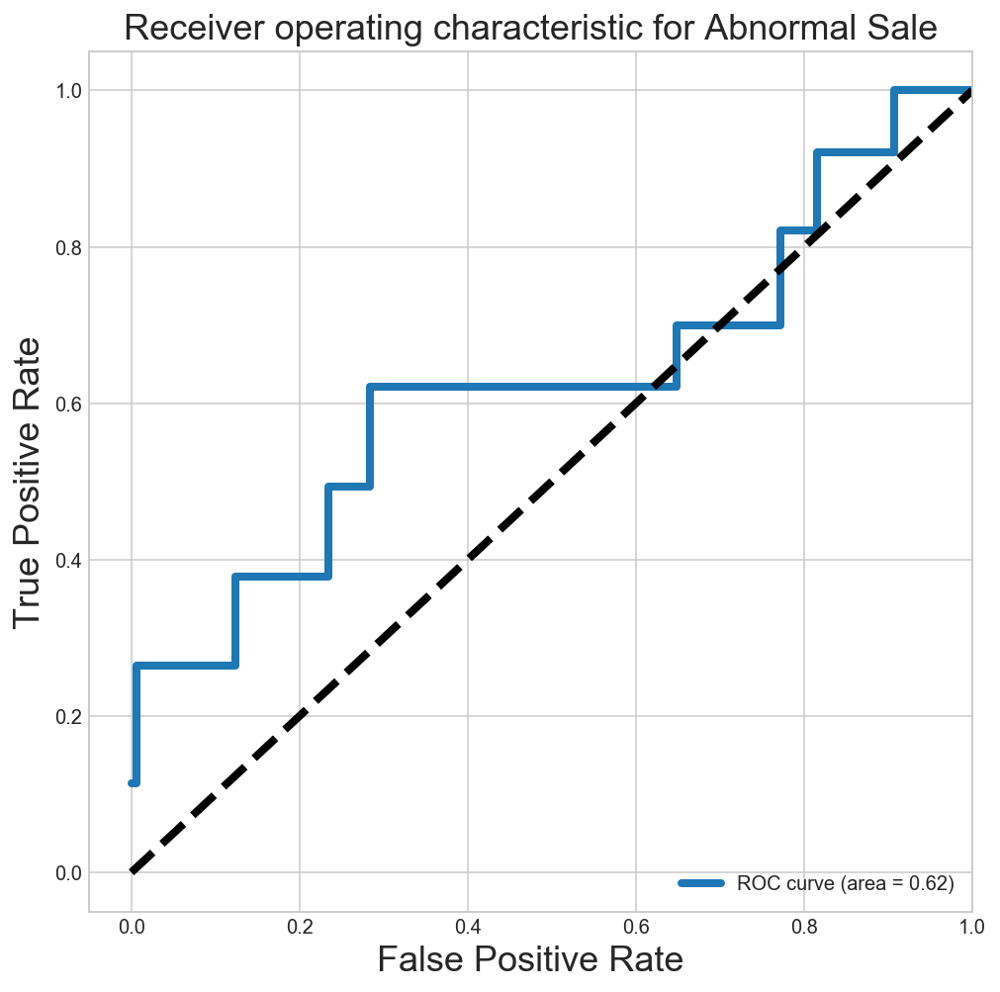

auc: 0.6242504409171076


In [82]:
#predict probability
Y_pp = pd.DataFrame(best_lr.predict_proba(X_test_ss), columns=['class_0_pp','class_1_pp'])
#roc, auc for model performance measurement against random forest classifier later
from sklearn.metrics import roc_curve, auc
# For class 1, find the area under the curve.
fpr, tpr, _ = roc_curve(y_test, Y_pp.class_1_pp)
roc_auc = auc(fpr, tpr)

# Plot of a ROC curve for class 1 (abnormal sale).
plt.figure(figsize=[8,8])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc, linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('Receiver operating characteristic for Abnormal Sale', fontsize=18)
plt.legend(loc="lower right")
plt.show()
print 'auc:',roc_auc

### Solution 2: Use Random Forest Classifier allows learning of signals from both classes, even on unbalanced datasets (due to resampling method - bagging).

In [83]:
#get unbalanced dataset train-test split
X_train_unbal = df_ab_dum[df_ab_dum['YrSold'] != 2010].iloc[:,:-2]
y_train_unbal = df_ab_dum[df_ab_dum['YrSold'] != 2010]['Abnormal']
X_test_unbal = df_ab_dum[df_ab_dum['YrSold'] == 2010].iloc[:,:-2]
y_test_unbal = df_ab_dum[df_ab_dum['YrSold'] == 2010]['Abnormal']

In [84]:
#baseline accuracy 93%
y_train_unbal.value_counts()/len(y_train_unbal)

0    0.93155
1    0.06845
Name: Abnormal, dtype: float64

In [85]:
#use a randomized search due to large number of parameters
from sklearn.model_selection import RandomizedSearchCV
random_grid = {'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10]
}

In [86]:
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train_unbal_ss, y_train_unbal)
print rf_random.best_score_
print rf_random.best_params_
#model score is not much higher than baseline of 93%

NameError: name 'RandomForestClassifier' is not defined

In [ ]:
#predict probability
Y_pp = pd.DataFrame(rf_random.predict_proba(X_test_unbal_ss), columns=['class_0_pp','class_1_pp'])
#roc, auc for model for common performance measurement
from sklearn.metrics import roc_curve, auc
# For class 1, find the area under the curve.
fpr, tpr, _ = roc_curve(y_test_unbal, Y_pp.class_1_pp)
roc_auc = auc(fpr, tpr)

# Plot of a ROC curve for class 1 (abnormal sale).
plt.figure(figsize=[8,8])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc, linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('Receiver operating characteristic for Abnormal Sale', fontsize=18)
plt.legend(loc="lower right")
plt.show()
print 'auc:',roc_auc

### Solution 2 performs better on unbalanced dataset. Solution 2 AUC: 0.66 < Solution 1 AUC: 0.62.

#### Futher looking at test scores for both models on unbalanced test sets.

In [ ]:
#Baseline
1 - y_test_unbal.sum()/float(len(y_test_unbal))

In [ ]:
#Randomforest score
rf_random.score(X_test_unbal_ss, y_test_unbal)

In [ ]:
#Selected lasso logistic regression score on unabalanced dataset
X_test_unbal_lr = X_test_unbal[X_train_sel.columns]#get select X columns from unbalanced dataset
X_test_unbal_lr_ss = StandardScaler().fit_transform(X_test_unbal_lr)#standardize the selected Xs
best_lr.score(X_test_unbal_lr_ss, y_test_unbal)

## The score for logistics regression is very bad even after training on a upsampled dataset.
### Solution 1 is not effective.

## Proportioning basement finishing sq area into % of total basement area (Jin's method rocks!)